In [52]:
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from hyperopt import fmin, tpe, hp, Trials, space_eval
from sklearn.metrics import mean_squared_error
from util import evaluate, plot_importance, plot_history
from sklearn.model_selection import train_test_split#安装库运行环境先百度清华镜像，清华镜像下载速度较快

In [53]:
data = pd.read_csv(r"G:\数据准备\12个城市外国PM2.5-网格形式\7个超大城市范围\北京市分区csv\北京市1_matched.csv")

In [54]:
cols = [ 'TCC_midu', 'building_density', 'bus_coverage_area', 'population_density', 'subway_coverage_area',
        'road_density',  'beijing_SY_midu', 'poi_hhd2', 'beijing_JZ_midu', 'beijing_LD_midu', 'beijing_GF_midu']#选择的自变量
X = data[cols]
y = data['value']

In [55]:
X

,TCC_midu,building_density,bus_coverage_area,population_density,subway_coverage_area,road_density,beijing_SY_midu,poi_hhd2,beijing_JZ_midu,beijing_LD_midu,beijing_GF_midu
0,0.000000,0.000000,0.000000,0.000000,0.000000,25.851327,0.000000,0.000000e+00,0.0,0.000000,0.000000
1,38.690257,0.000000,0.038382,1.383177,0.000000,11.290836,0.000000,-1.000000e-10,0.0,0.000000,9.672564
2,64.385606,0.000000,0.658515,0.396219,0.033230,6.568564,0.000000,-1.000000e-10,0.0,0.000000,0.000000
3,77.378942,0.000000,0.816347,0.000000,0.297238,0.598162,0.000000,0.000000e+00,0.0,0.000000,0.000000
4,68.678765,0.000000,1.736628,0.473120,0.393135,2.365290,0.000000,-1.000000e-10,0.0,0.000000,2.543658
...,...,...,...,...,...,...,...,...,...,...,...
932,0.000000,0.000000,0.050519,0.265530,0.000000,3.473759,0.000000,0.000000e+00,0.0,0.000000,0.000000
933,80.991430,0.026817,0.058915,0.369595,0.000000,2.646915,4.562897,5.004024e-01,0.0,0.000000,1.140724
934,48.877312,0.000000,0.125264,0.279299,0.000000,5.510022,6.982473,-1.000000e-10,0.0,0.000000,0.000000
935,69.937381,0.053502,1.155024,0.467476,0.000000,1.935215,8.588801,1.060602e+00,0.0,0.000000,4.907886


In [56]:
y

0      38.299999
1      38.599998
2      38.900002
3      38.799999
4      38.700001
         ...    
932    40.400002
933    41.099998
934    40.900002
935    41.299999
936    41.599998
Name: value, Length: 937, dtype: float64

In [57]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)#总数据分出0.2测试集和0.8训练集

In [58]:
X_train,X_valid,y_train,y_valid = train_test_split(X_train,y_train,test_size=0.2,random_state=42)#0.8的训练集分成0.2的训练集和0.8测试集

In [59]:
print('训练集大小:',X_train.shape[0])
print('测试集大小:',X_test.shape[0])
print('验证集大小:',X_valid.shape[0])

训练集大小: 599
测试集大小: 188
验证集大小: 150


In [60]:
param_space = {
    "max_depth": hp.choice("max_depth", np.linspace(1, 10, 10, dtype=int)),#2是最小，10是最大，9是分9份。此参数为学习深度默认值6典型最终值3-10
    "gamma": hp.choice("gamma", np.linspace(0.01, 1, 10)),#默认值为0使算法保守根据损失函数变化进行调整
    "n_estimators": hp.choice("n_estimators", np.linspace(1, 500, 500, dtype=int)),#最后是分多少份，迭代可以增加平线长度使得测试集和训练集更加贴近，老师修改的4000
    "colsample_bytree": hp.choice("colsample_bytree", np.linspace(0.5, 1, 10)),#减慢学习速度方法通过子样本和这个减少样本数和特征，让数值更小典型最终值0.5-1
    "subsample": hp.quniform("subsample", 0.5, 0.7, 0.1),#使算法更加保守，防治过拟合，太小的值会欠拟合。典型最终值0.5-1
    "eta": hp.uniform("eta", 0.01, 0.2),#学习率可以放慢学习速度，限制集合中每棵树的贡献默认值0.3，可以尝试较小的值0.01，典型最终值0.01-0.2
    "objective": "reg:squarederror",
    "eval_metric": "rmse",
    "random_state": 0
}

In [61]:
def score(params):
    model = xgb.XGBRegressor(**params)
    model.fit(X_train, y_train,#可以修改为训练集、测试集、验证集，寻找最佳参数的某个值
              eval_set=[(X_train, y_train), (X_valid, y_valid)],
              early_stopping_rounds=10,
              verbose=False)
    y_pred = model.predict(X_valid)
    score = mean_squared_error(y_valid, y_pred)
    return {"loss": score, "status": "ok"}

In [62]:
trials = Trials()
best_params_loc = fmin(score, param_space, algo=tpe.suggest, max_evals=50, trials=trials)
optimal_params = space_eval(param_space, best_params_loc)

  4%|▍         | 2/50 [00:00<00:08,  5.72trial/s, best loss: 4.165250047885882]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



  6%|▌         | 3/50 [00:00<00:08,  5.67trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 12%|█▏        | 6/50 [00:00<00:05,  8.39trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 16%|█▌        | 8/50 [00:00<00:04,  9.70trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 20%|██        | 10/50 [00:01<00:04,  9.09trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 24%|██▍       | 12/50 [00:01<00:06,  6.17trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 32%|███▏      | 16/50 [00:02<00:04,  7.84trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 36%|███▌      | 18/50 [00:02<00:03,  9.22trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 40%|████      | 20/50 [00:02<00:03,  9.85trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 44%|████▍     | 22/50 [00:02<00:03,  8.78trial/s, best loss: 4.087485731952842]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 48%|████▊     | 24/50 [00:03<00:04,  5.96trial/s, best loss: 3.97250374343309] 

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 50%|█████     | 25/50 [00:03<00:04,  5.34trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 52%|█████▏    | 26/50 [00:03<00:04,  5.57trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 58%|█████▊    | 29/50 [00:04<00:02,  7.35trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 60%|██████    | 30/50 [00:04<00:02,  6.75trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 66%|██████▌   | 33/50 [00:04<00:02,  6.91trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 68%|██████▊   | 34/50 [00:04<00:02,  6.28trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 76%|███████▌  | 38/50 [00:05<00:01,  8.67trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 82%|████████▏ | 41/50 [00:05<00:01,  7.61trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 84%|████████▍ | 42/50 [00:05<00:01,  7.73trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 88%|████████▊ | 44/50 [00:05<00:00,  8.96trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 92%|█████████▏| 46/50 [00:06<00:00,  7.26trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



 98%|█████████▊| 49/50 [00:06<00:00,  8.91trial/s, best loss: 3.97250374343309]

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



100%|██████████| 50/50 [00:06<00:00,  7.40trial/s, best loss: 3.97250374343309]


In [63]:
optimal_params#输出最佳参数

{'colsample_bytree': 0.7777777777777778,
 'eta': 0.11098874313267323,
 'eval_metric': 'rmse',
 'gamma': 0.01,
 'max_depth': 9,
 'n_estimators': 226,
 'objective': 'reg:squarederror',
 'random_state': 0,
 'subsample': 0.5}

# Fit on entire train and evaluate on test set

In [64]:
X_train = pd.concat([X_train, X_valid])
y_train = pd.concat([y_train, y_valid])

In [65]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [66]:
model = xgb.XGBRegressor(**optimal_params)
model.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_test, y_test), (X_valid, y_valid)],
    early_stopping_rounds=10,
    verbose=True
)

[0]	validation_0-rmse:2.69901	validation_1-rmse:2.86377	validation_2-rmse:2.77396
[1]	validation_0-rmse:2.53654	validation_1-rmse:2.76951	validation_2-rmse:2.60596
[2]	validation_0-rmse:2.39520	validation_1-rmse:2.67630	validation_2-rmse:2.45239
[3]	validation_0-rmse:2.28504	validation_1-rmse:2.63270	validation_2-rmse:2.36650
[4]	validation_0-rmse:2.16317	validation_1-rmse:2.58221	validation_2-rmse:2.23853
[5]	validation_0-rmse:2.05412	validation_1-rmse:2.54650	validation_2-rmse:2.15097
[6]	validation_0-rmse:1.96337	validation_1-rmse:2.51439	validation_2-rmse:2.05313
[7]	validation_0-rmse:1.86963	validation_1-rmse:2.47957	validation_2-rmse:1.95727
[8]	validation_0-rmse:1.79152	validation_1-rmse:2.46174	validation_2-rmse:1.88894
[9]	validation_0-rmse:1.72846	validation_1-rmse:2.44577	validation_2-rmse:1.82944
[10]	validation_0-rmse:1.67317	validation_1-rmse:2.42954	validation_2-rmse:1.77480
[11]	validation_0-rmse:1.60466	validation_1-rmse:2.43326	validation_2-rmse:1.72246
[12]	validatio

C:\ProgramData\anaconda3\Lib\site-packages\xgboost\sklearn.py:885: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[52]	validation_0-rmse:0.55629	validation_1-rmse:2.30899	validation_2-rmse:1.09103
[53]	validation_0-rmse:0.54647	validation_1-rmse:2.31124	validation_2-rmse:1.08048
[54]	validation_0-rmse:0.53530	validation_1-rmse:2.31321	validation_2-rmse:1.07853
[55]	validation_0-rmse:0.52556	validation_1-rmse:2.31420	validation_2-rmse:1.07885
[56]	validation_0-rmse:0.51426	validation_1-rmse:2.31616	validation_2-rmse:1.08186
[57]	validation_0-rmse:0.50498	validation_1-rmse:2.31641	validation_2-rmse:1.07602
[58]	validation_0-rmse:0.49195	validation_1-rmse:2.31241	validation_2-rmse:1.06709
[59]	validation_0-rmse:0.47892	validation_1-rmse:2.31205	validation_2-rmse:1.06671
[60]	validation_0-rmse:0.46604	validation_1-rmse:2.31013	validation_2-rmse:1.05846
[61]	validation_0-rmse:0.45662	validation_1-rmse:2.30891	validation_2-rmse:1.05763
[62]	validation_0-rmse:0.44533	validation_1-rmse:2.31014	validation_2-rmse:1.05466
[63]	validation_0-rmse:0.43369	validation_1-rmse:2.30878	validation_2-rmse:1.05202
[64]

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7777777777777778, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eta=0.11098874313267323, eval_metric='rmse', feature_types=None,
             gamma=0.01, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=9, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=226, n_jobs=None,
             num_parallel_tree=None, ...)

In [68]:
Z = model.predict(data[cols])

xx = np.zeros(shape=(937,2))
xx[:,0]=data['value'].values
xx[:,1]=Z
np.savetxt('XGB.csv', xx, delimiter = ',') 

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 0.09141173333209085
MSE = 0.019114052653529556
RMSE = 0.13825358097904572
MAPE = 0.00244385821214123
R^2 = 0.9976539413360638
Explained Variance Score = 0.9976539471355336

Residuals summary stats
╒═══════╤═════════════╕
│ count │         655 │
├───────┼─────────────┤
│ mean  │ 0.000217371 │
├───────┼─────────────┤
│ std   │    0.138359 │
├───────┼─────────────┤
│ min   │   -0.793713 │
├───────┼─────────────┤
│ 25%   │  -0.0670967 │
├───────┼─────────────┤
│ 50%   │ -0.00428009 │
├───────┼─────────────┤
│ 75%   │   0.0612106 │
├───────┼─────────────┤
│ max   │    0.978146 │
╘═══════╧═════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  80.7634 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  95.2672 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  98.4733 │       99.7 │
╘════════════╧══════════╧════════════╛

Jar

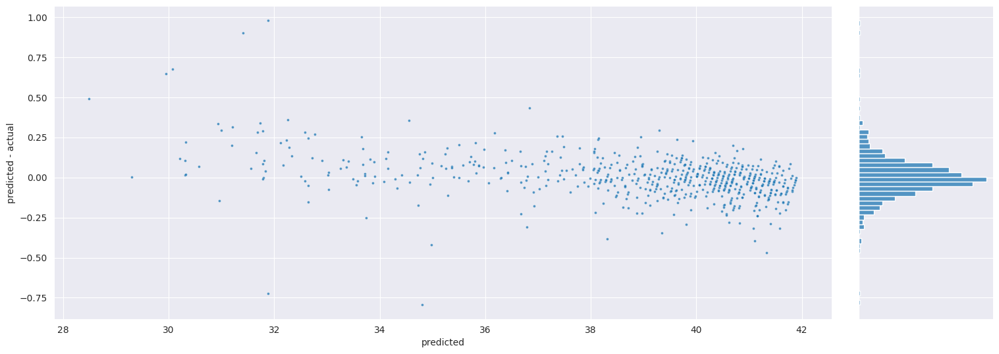

<Figure size 1000x800 with 0 Axes>

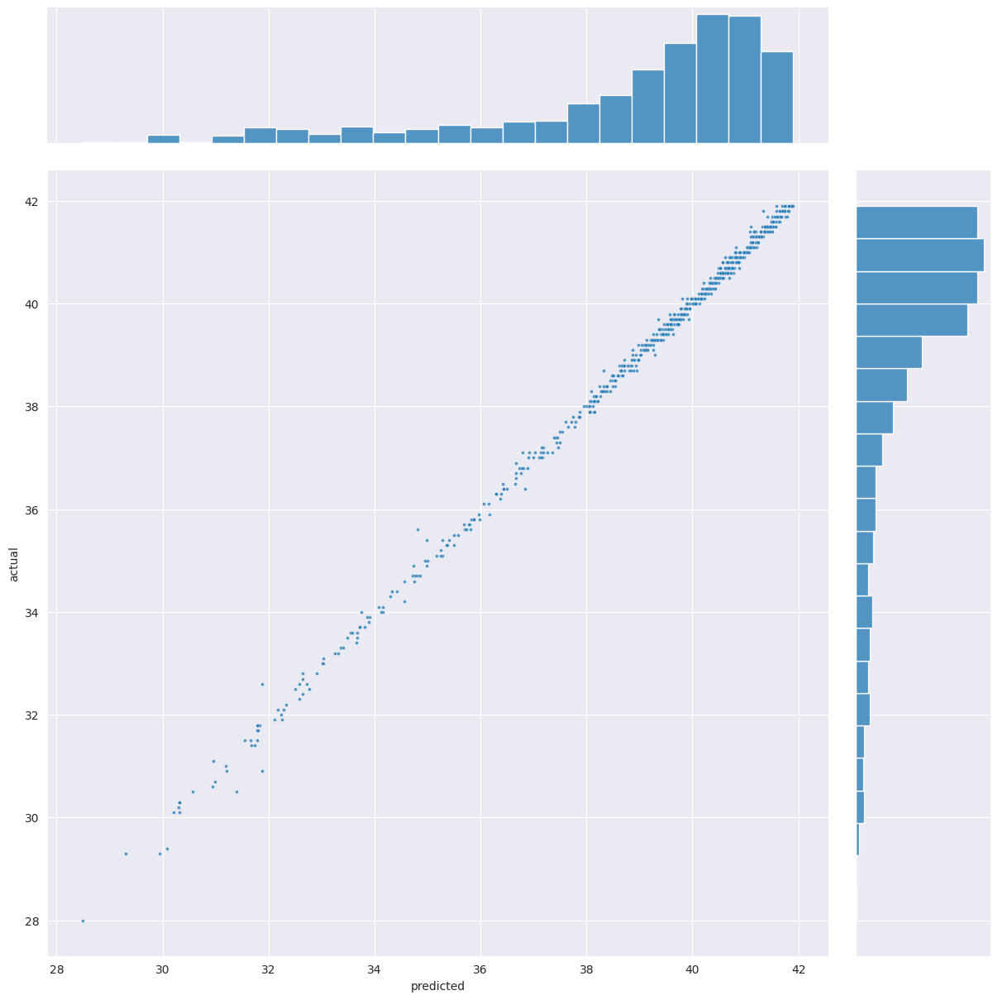

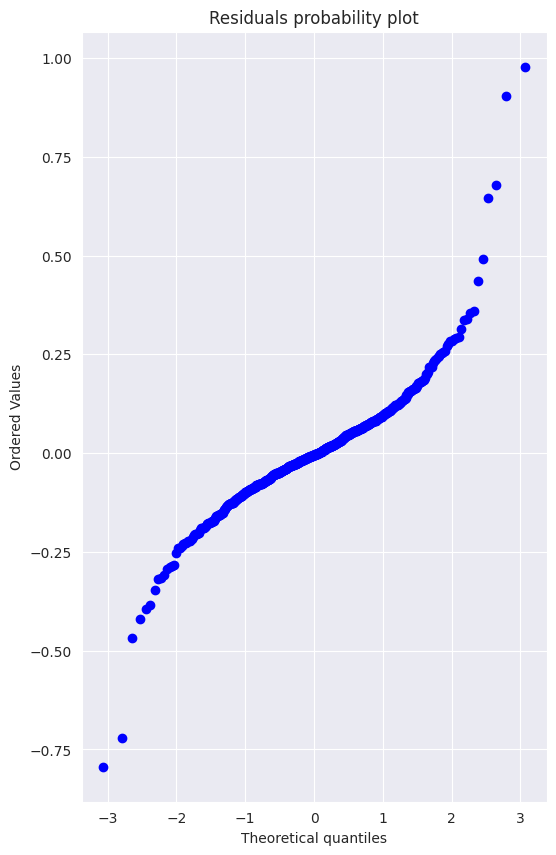

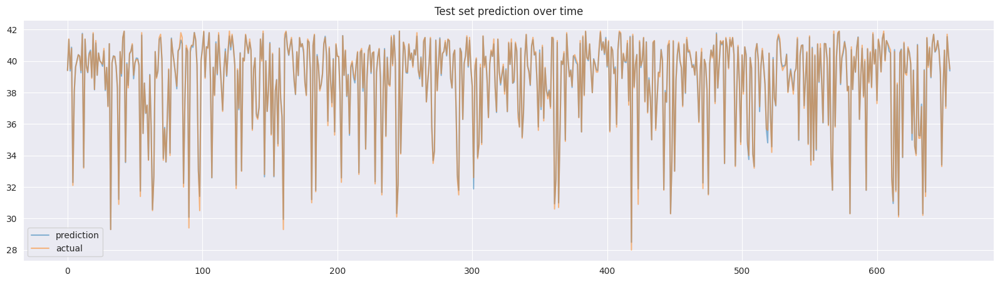

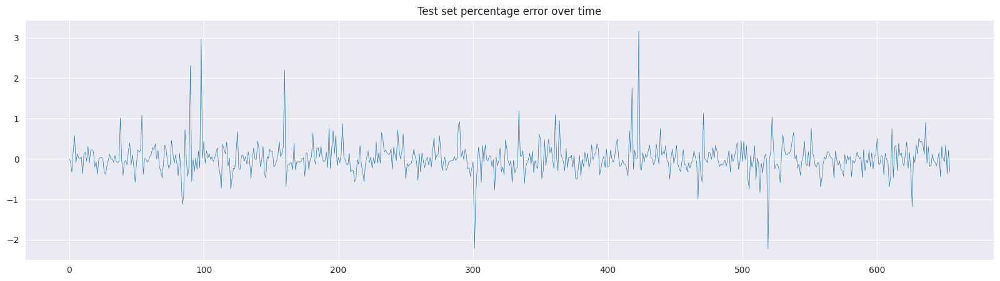

In [69]:
y_train_pred = model.predict(X_train)
evaluate(y_train.to_numpy(), y_train_pred)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 0.3743589403423826
MSE = 0.9754504580434193
RMSE = 0.9876489548637306
MAPE = 0.010248738190745253
R^2 = 0.8851481389305262
Explained Variance Score = 0.8856622123518155

Residuals summary stats
╒═══════╤════════════╕
│ count │        150 │
├───────┼────────────┤
│ mean  │  0.0660764 │
├───────┼────────────┤
│ std   │   0.988737 │
├───────┼────────────┤
│ min   │   -3.40585 │
├───────┼────────────┤
│ 25%   │ -0.0688124 │
├───────┼────────────┤
│ 50%   │  0.0140629 │
├───────┼────────────┤
│ 75%   │  0.0839109 │
├───────┼────────────┤
│ max   │    7.21142 │
╘═══════╧════════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  88.6667 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  94.6667 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  96      │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-Bera Test on Res

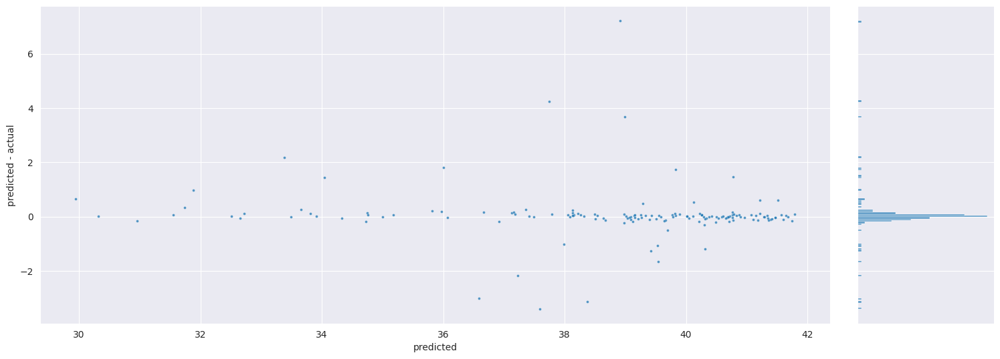

<Figure size 1000x800 with 0 Axes>

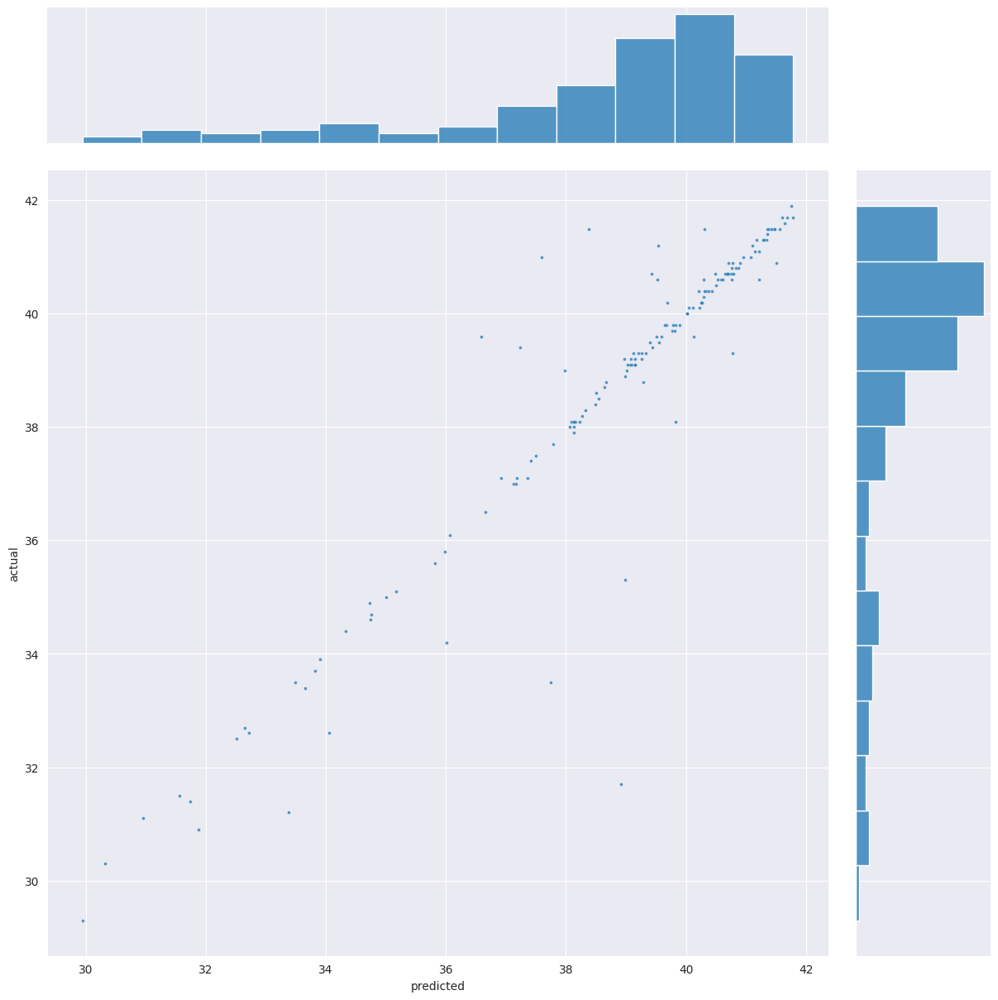

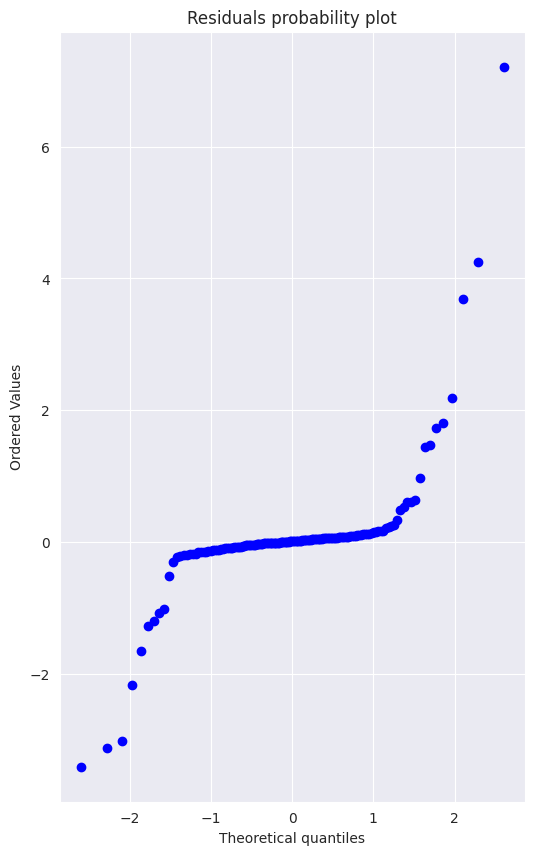

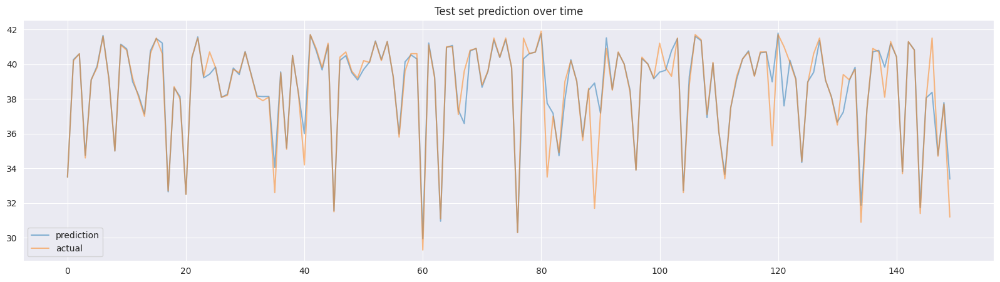

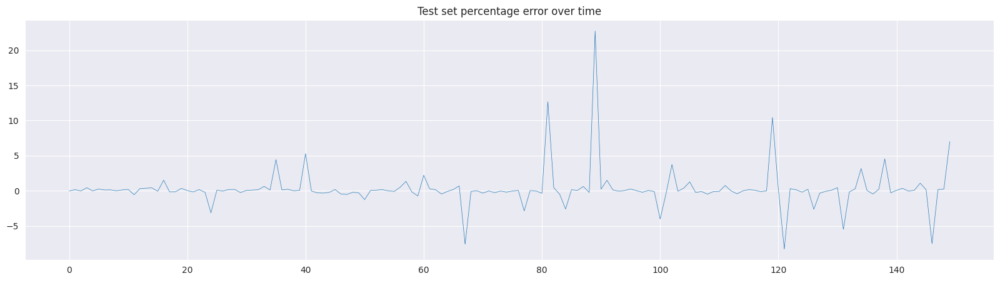

In [70]:
y_valid_pred = model.predict(X_valid)
evaluate(y_valid.to_numpy(), y_valid_pred)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


MAE = 1.715872210136407
MSE = 5.286759647528282
RMSE = 2.2992954676440087
MAPE = 0.04647294865990382
R^2 = 0.38165200237596786
Explained Variance Score = 0.381678989679085

Residuals summary stats
╒═══════╤══════════╕
│ count │      282 │
├───────┼──────────┤
│ mean  │  0.01519 │
├───────┼──────────┤
│ std   │  2.30333 │
├───────┼──────────┤
│ min   │ -6.64249 │
├───────┼──────────┤
│ 25%   │ -1.37843 │
├───────┼──────────┤
│ 50%   │ -0.30901 │
├───────┼──────────┤
│ 75%   │  1.17704 │
├───────┼──────────┤
│ max   │  8.63585 │
╘═══════╧══════════╛

Deviation from mean of residuals
╒════════════╤══════════╤════════════╕
│ Interval   │   Actual │   Expected │
╞════════════╪══════════╪════════════╡
│ μ ± σ      │  74.8227 │       68.2 │
├────────────┼──────────┼────────────┤
│ μ ± 2σ     │  94.3262 │       95.4 │
├────────────┼──────────┼────────────┤
│ μ ± 3σ     │  98.9362 │       99.7 │
╘════════════╧══════════╧════════════╛

Jarque-Bera Test on Residuals
╒══════════════╤══════════════

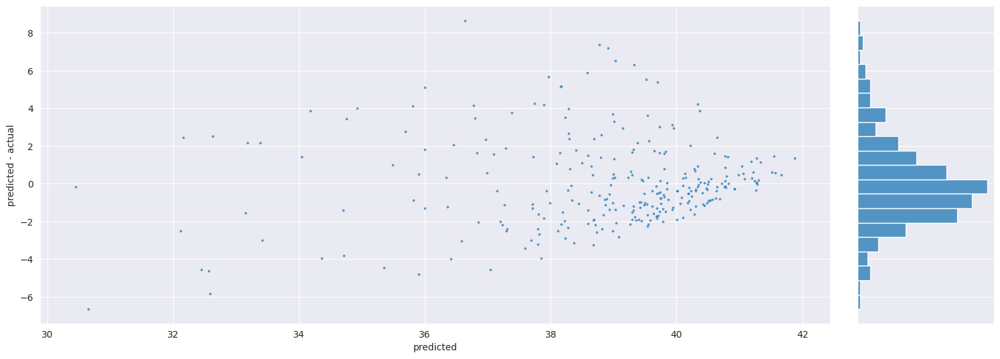

<Figure size 1000x800 with 0 Axes>

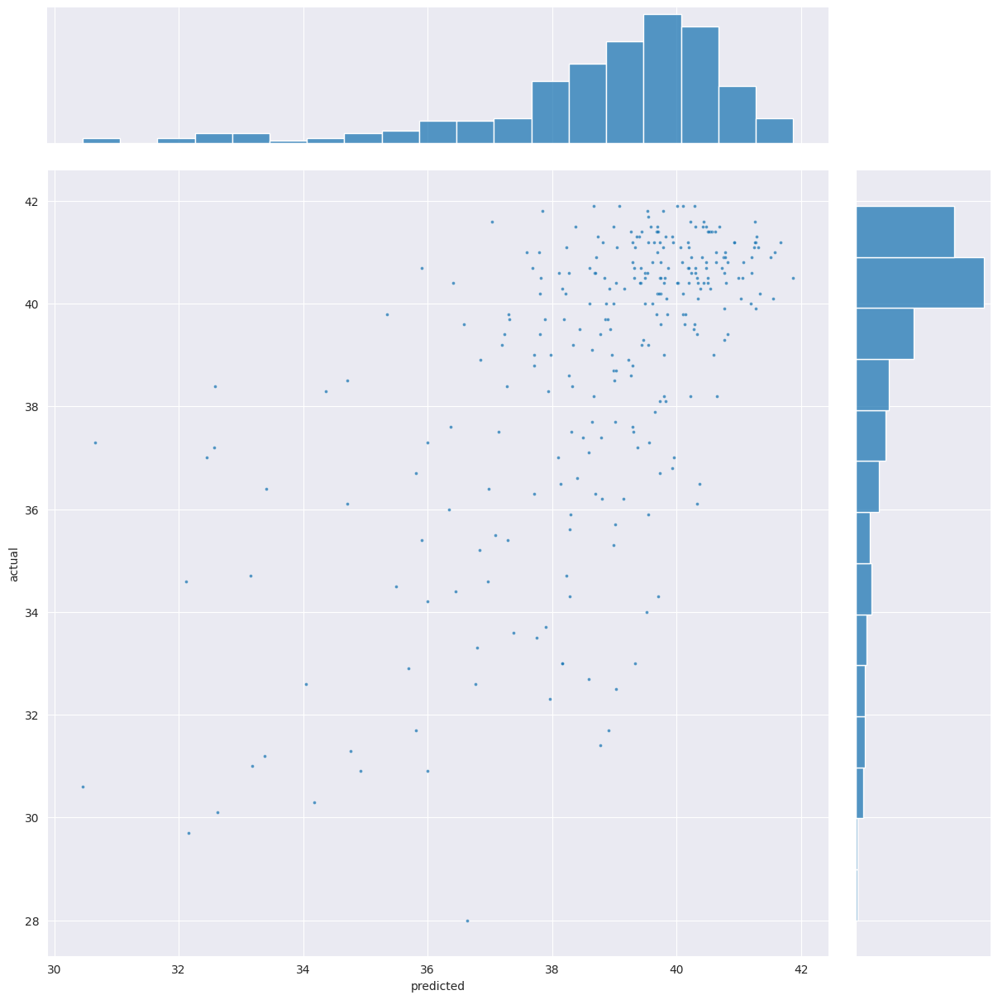

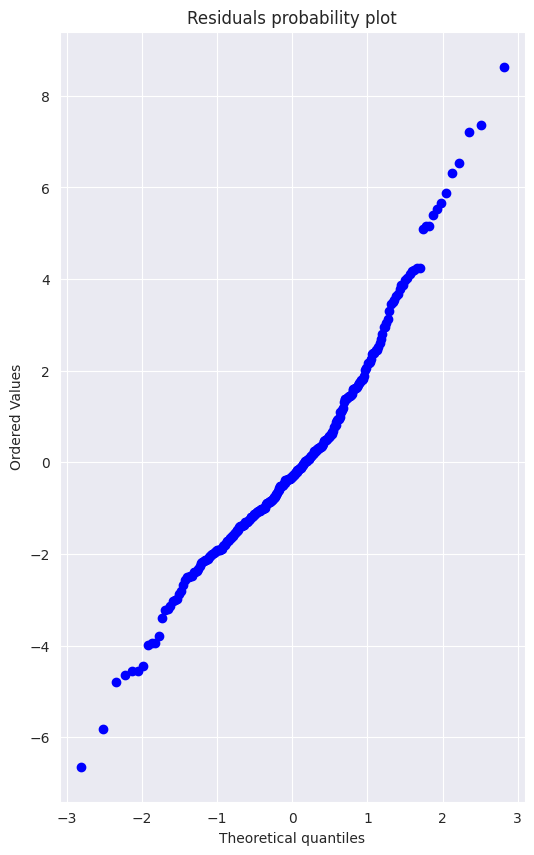

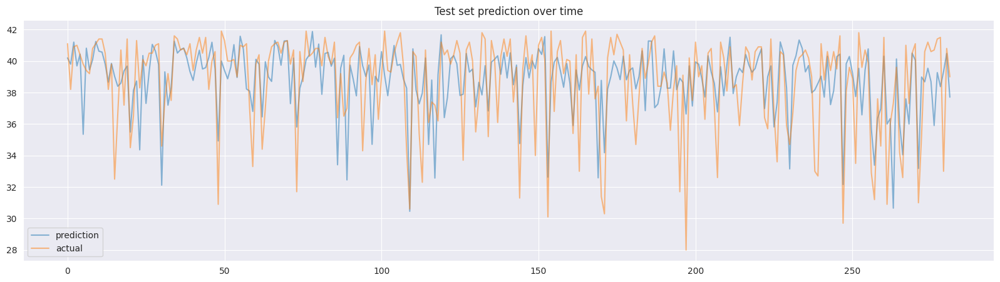

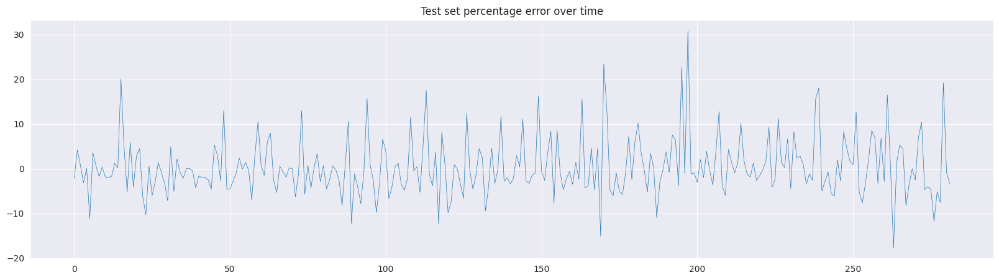

In [71]:
y_pred = model.predict(X_test)
evaluate(y_test.to_numpy(), y_pred)

In [72]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
# define an additional metric 
def MAPE(true, pred):
    diff = np.abs(np.array(true) - np.array(pred))
    return np.mean(diff / abs(true))

In [73]:
print("Training R2:", r2_score(y_train, y_train_pred), "traing RMSE:", np.sqrt(mean_squared_error(y_train, y_train_pred)), "training MAE:", mean_absolute_error(y_train, y_train_pred), "MAPE:", MAPE(y_train, y_train_pred)*100,"%")

Training R2: 0.9976539413360638 traing RMSE: 0.13825358097904572 training MAE: 0.09141173333209085 MAPE: 0.244385821214123 %


In [74]:
print("Testing R2:", r2_score(y_test, y_pred), "Testing RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)), "Testing MAE:", mean_absolute_error(y_test, y_pred), "MAPE:", MAPE(y_test, y_pred)*100,"%")

Testing R2: 0.38165200237596786 Testing RMSE: 2.2992954676440087 Testing MAE: 1.715872210136407 MAPE: 4.647294865990382 %


In [75]:
print("Valid R2:", r2_score( y_valid, y_valid_pred), "valid RMSE:", np.sqrt(mean_squared_error(y_valid, y_valid_pred)), "Testing MAE:", mean_absolute_error(y_valid, y_valid_pred), "MAPE:", MAPE(y_valid, y_valid_pred)*100,"%")

Valid R2: 0.8851481389305262 valid RMSE: 0.9876489548637306 Testing MAE: 0.3743589403423826 MAPE: 1.0248738190745252 %


In [25]:
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
from tabulate import tabulate
import matplotlib.pyplot as plt
from scipy.stats import probplot
from statsmodels.stats.stattools import jarque_bera
from sklearn import metrics


def combine_data():
    data = []
    for file in sorted(os.listdir("pp_gas_emission")):
        df = pd.read_csv(f"./pp_gas_emission/{file}")
        df['year'] = int(file[3:7])
        data.append(df)
    df = pd.concat(data)
    df.drop_duplicates(inplace=True)
    df.reset_index(inplace=True, drop=True)
    df["target"] = df["TEY"].shift(-1)
    df.drop(df.tail(1).index, inplace=True)
    df.to_parquet("pp_gas_emission.parquet")


def evaluate(y_test, y_pred):
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = metrics.mean_squared_error(y_test, y_pred, squared=False)
    r2 = metrics.r2_score(y_test, y_pred)
    explained_var_score = metrics.explained_variance_score(y_test, y_pred)
    mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
    print(f"MAE = {mae}")
    print(f"MSE = {mse}")
    print(f"RMSE = {rmse}")
    print(f"MAPE = {mape}")
    print(f"R^2 = {r2}")
    print(f"Explained Variance Score = {explained_var_score}")

    residuals = y_pred - y_test
    print("\nResiduals summary stats")
    print(tabulate(
        pd.Series(residuals).describe().to_frame(),
        numalign="right", tablefmt="fancy_grid",
    ))

    with sns.axes_style("darkgrid"):
        g = sns.jointplot(x=y_pred, y=y_pred-y_test, s=8, alpha=0.75, height=12)
        g.set_axis_labels('predicted', 'predicted - actual')
        g.fig.set_figwidth(15)
        g.fig.set_figheight(6)
        g.ax_marg_x._visible = False

        plt.figure(figsize=(10, 8))
        g = sns.jointplot(x=y_pred, y=y_test, s=8, alpha=0.75, height=12)
        g.set_axis_labels('predicted', 'actual')

        fig, ax = plt.subplots(1, 1, figsize=(6, 10))
        probplot(residuals, sparams=(0, 1), plot=ax, fit=False)
        ax.set_title("Residuals probability plot")

        plt.figure(figsize=(20, 5))
        plt.plot(y_pred, alpha=0.5, label="prediction")
        plt.plot(y_test, alpha=0.5, label="actual")
        plt.legend()
        plt.title("Test set prediction over time")
        
        plt.figure(figsize=(20, 5))
        plt.plot(100*(residuals)/y_test, linewidth=0.5)
        plt.title("Test set percentage error over time")
    
    res_mean = residuals.mean()
    res_std = residuals.std()

    one_std_condition = ((residuals >= res_mean - 1*res_std) & (residuals <= res_mean + 1*res_std))
    two_std_condition = ((residuals >= res_mean - 2*res_std) & (residuals <= res_mean + 2*res_std))
    three_std_condition = ((residuals >= res_mean - 3*res_std) & (residuals <= res_mean + 3*res_std))
    perc_within_one_std = 100*len(residuals[np.where(one_std_condition)])/len(residuals)
    perc_within_two_std = 100*len(residuals[np.where(two_std_condition)])/len(residuals)
    perc_within_three_std = 100*len(residuals[np.where(three_std_condition)])/len(residuals)

    print("\nDeviation from mean of residuals")
    print(tabulate(pd.DataFrame({
        "μ ± σ": {"actual": perc_within_one_std, "expected": 68.2},
        "μ ± 2σ": {"actual": perc_within_two_std, "expected": 95.4},
        "μ ± 3σ": {"actual": perc_within_three_std, "expected": 99.7},  
    }).T, headers=["Interval", "Actual", "Expected"], tablefmt="fancy_grid"))
    
    print("\nJarque-Bera Test on Residuals")
    result = jarque_bera(residuals)
    result_labels = ("JB-Statistic", "Chi2-P-value", "Skew", "Kurtosis")
    print(tabulate(list(zip(result_labels, result)), tablefmt="fancy_grid"))


def plot_importance(model):
    # with sns.set_style("whitegrid"):
    with plt.style.context('ggplot'):
        fig, axes = plt.subplots(1, 3, figsize=(18, 18))
        fig.tight_layout(pad=8)
        axes[0] = xgb.plot_importance(model, ax=axes[0],
                                      importance_type="weight",
                                      xlabel="weight")
        axes[1] = xgb.plot_importance(model, ax=axes[1],
                                      importance_type="gain",
                                      xlabel="gain")
        axes[2] = xgb.plot_importance(model, ax=axes[2],
                                      importance_type="cover",
                                      xlabel="cover")
        for ax, title in zip(axes, ["weight", "gain", "cover"]):
            ax.set_title(f"Features ranked by {title}")
            ax.set_ylabel(None)
            ax.tick_params(axis="x", labelsize=10)
            ax.tick_params(axis="y", labelsize=10)
            for txt_obj in ax.texts:
                curr_text = txt_obj.get_text()
                new_text = round(float(curr_text), 1)
                txt_obj.set_text(new_text)
    return


def plot_history(model):
    # with sns.set_style("whitegrid"):
    with plt.style.context('ggplot'):
        history = model.evals_result()
        fig, ax = plt.subplots(1, 1, figsize=(14, 5))
        ax.plot(range(len(history['validation_0']['rmse'])),
                history['validation_0']['rmse'],
                label="Training RMSE", linewidth=2)
        ax.plot(range(len(history['validation_1']['rmse'])),
                history['validation_1']['rmse'],
                label="Testing RMSE", linewidth=2)
        ax.set_title('RMSE')
        ax.grid(True)
        ax.legend()
    return


def rolling_means(df, window, min_periods, cols=None):
    cols = cols or df.columns.to_list()
    df_roll = (df[cols]
               .rolling(window, min_periods=min_periods)
               .mean()
               .fillna(df))
    df_roll.columns = df_roll.columns.map(lambda c: f"{c}_ROLL{window}_MEAN")
    return df_roll


def rolling_standard_deviation(df, window, min_periods, cols=None):
    cols = cols or df.columns.to_list()
    df_roll = (df[cols]
               .rolling(window, min_periods=min_periods)
               .std()
               .fillna(1))
    df_roll.columns = df_roll.columns.map(lambda c: f"{c}_ROLL{window}_STD")
    return df_roll


def lagged_features(df, lags, cols=None):
    if isinstance(lags, int):
        lags = range(1, lags+1)
    cols = cols or df.columns.to_list()
    data = []
    for lag in lags:
        lagged_data = df[cols].shift(lag).fillna(df)
        lagged_data.columns = lagged_data.columns.map(lambda c: f"{c}_LAG{lag}")
        data.append(lagged_data)
    return pd.concat(data, axis="columns")

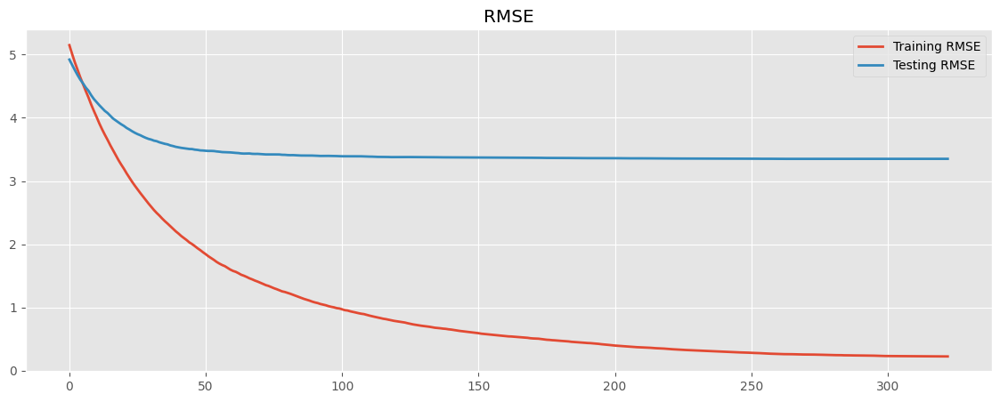

In [26]:
plot_history(model)

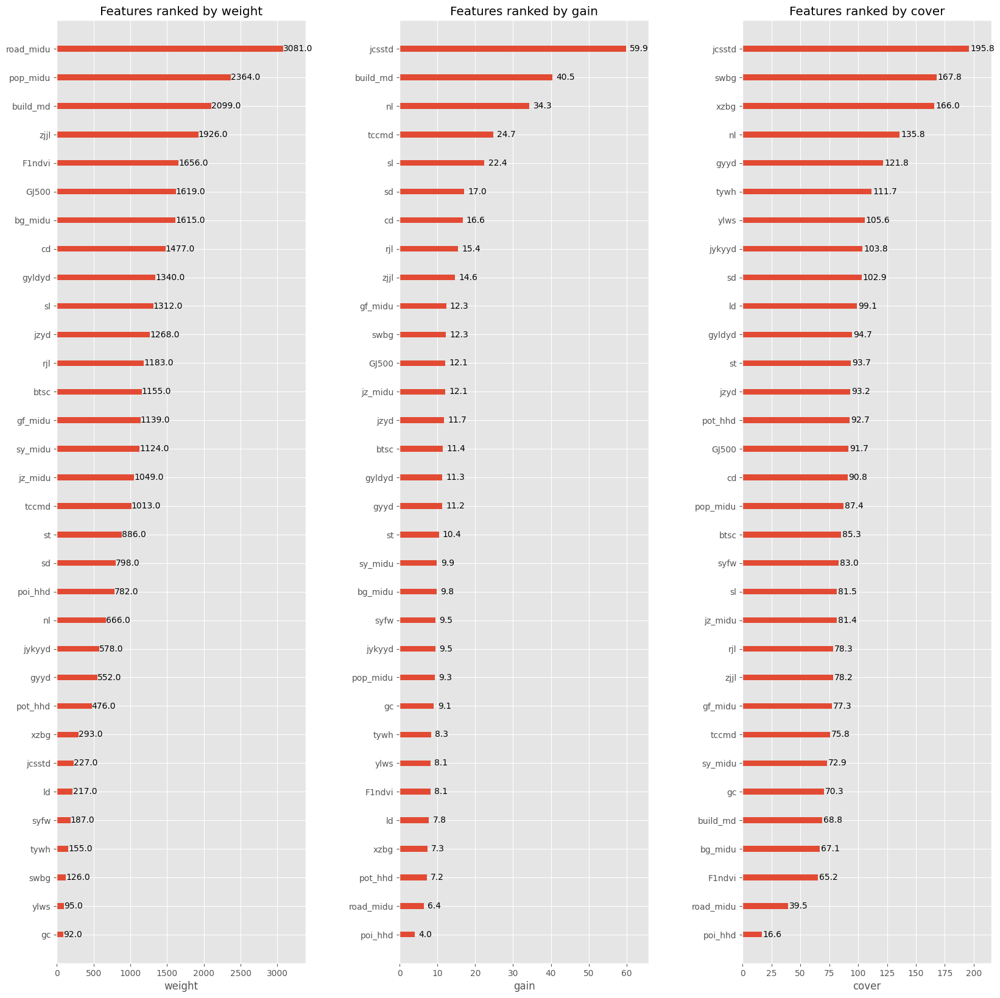

In [27]:
plot_importance(model)

In [28]:
import shap

In [29]:
cols = ['poi_hhd', 'road_midu', 'build_md','pop_midu','rjl','bg_midu','gf_midu','sy_midu','jz_midu','tccmd','F1ndvi','GJ500','zjjl',"jcsstd","gyldyd","gyyd","jykyyd","jzyd","swbg","syfw","tywh","xzbg","ylws","jtczyd","nl","sl","cd","gc","sd","st","btsc","ld",'pot_hhd',]

In [30]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(data[cols])
print(shap_values.shape)
np.savetxt('shap values.csv', shap_values, delimiter = ',') 
y_base = explainer.expected_value
print(y_base)
data['pred'] = model.predict(data[cols])
print(data['pred'].mean())

[10:30:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


(2384, 33)
33.80676
33.76183


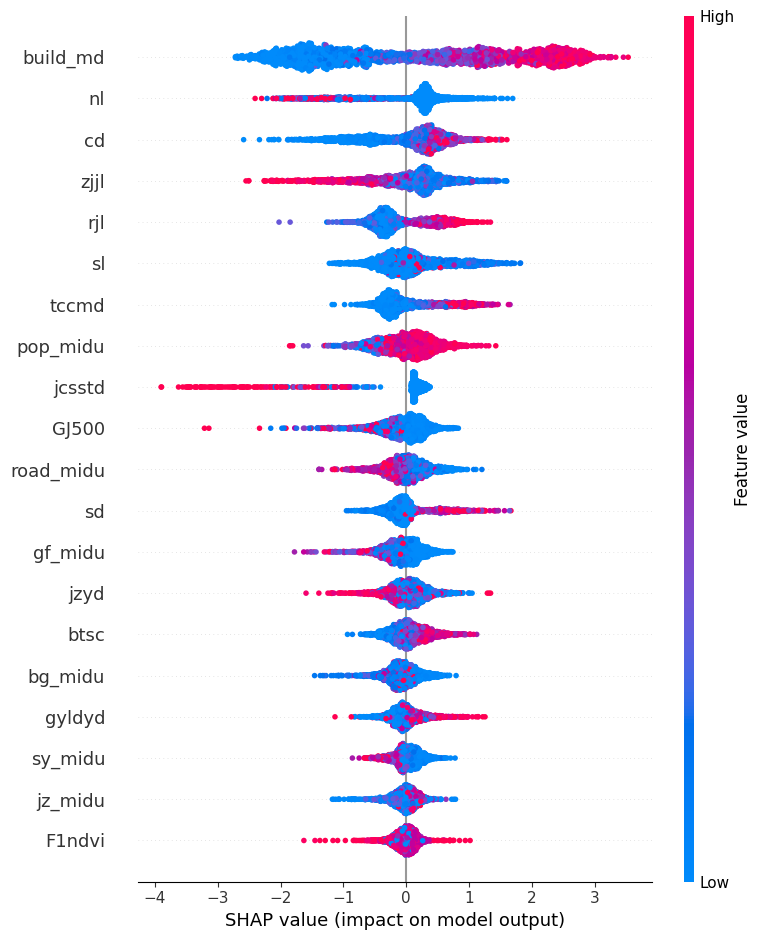

In [31]:
shap.summary_plot(shap_values, data[cols])

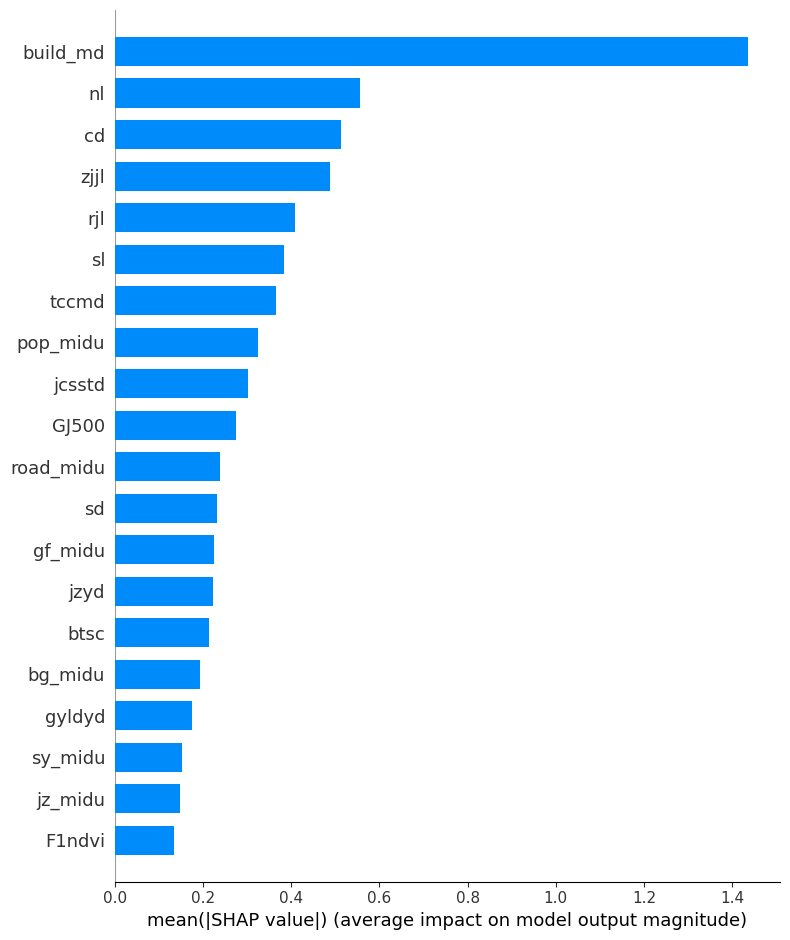

In [32]:
shap.summary_plot(shap_values, data[cols], plot_type="bar")

In [33]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(data[cols])

[10:31:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


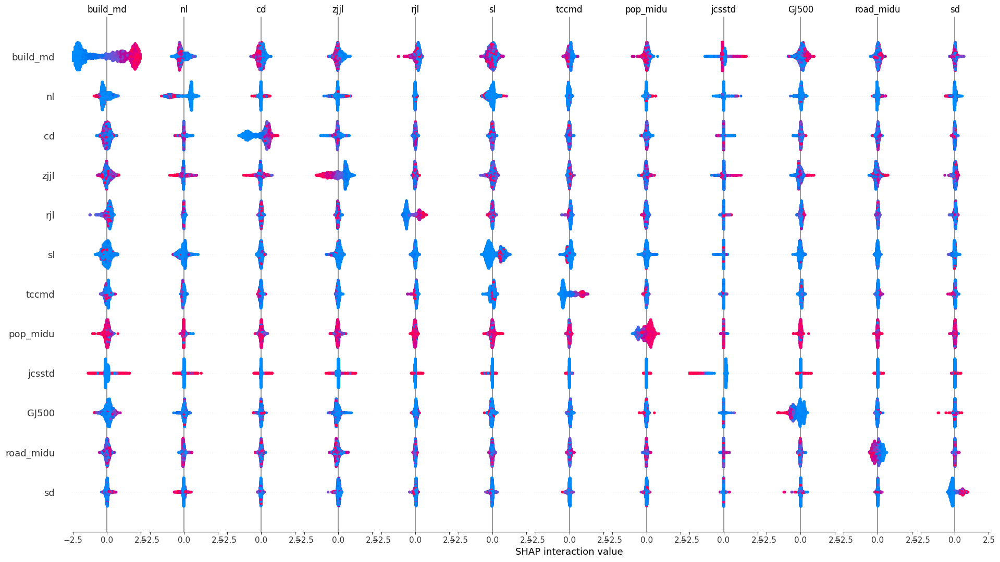

In [34]:
shap.summary_plot(shap_interaction_values, data[cols], max_display=12)

In [35]:
plt.rcParams['font.size'] = 14
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'Times New Roman'

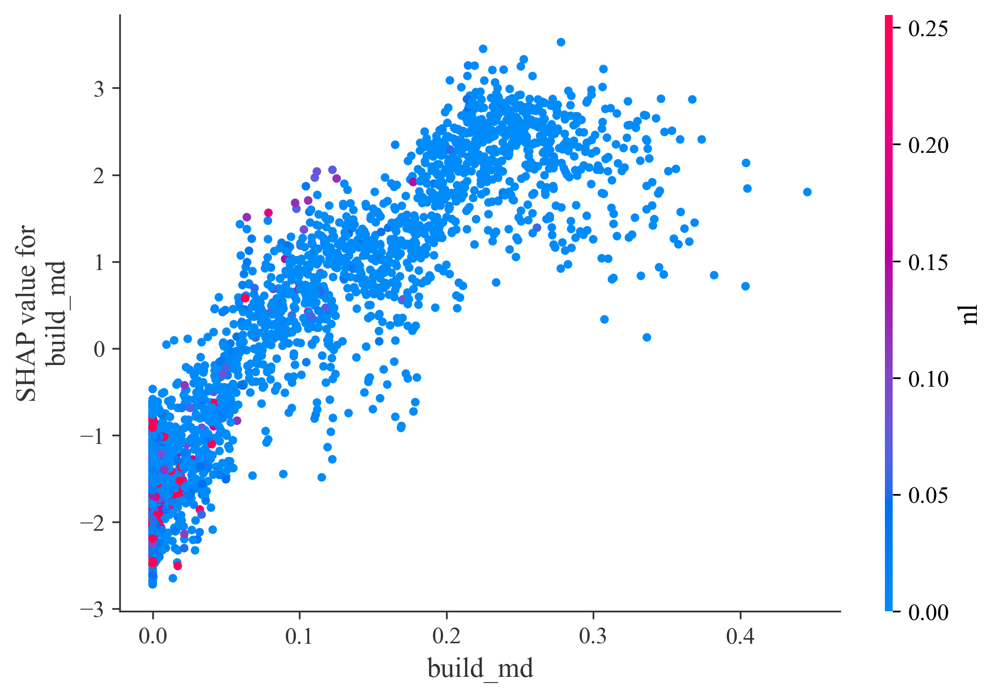

In [36]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='nl', show=False)

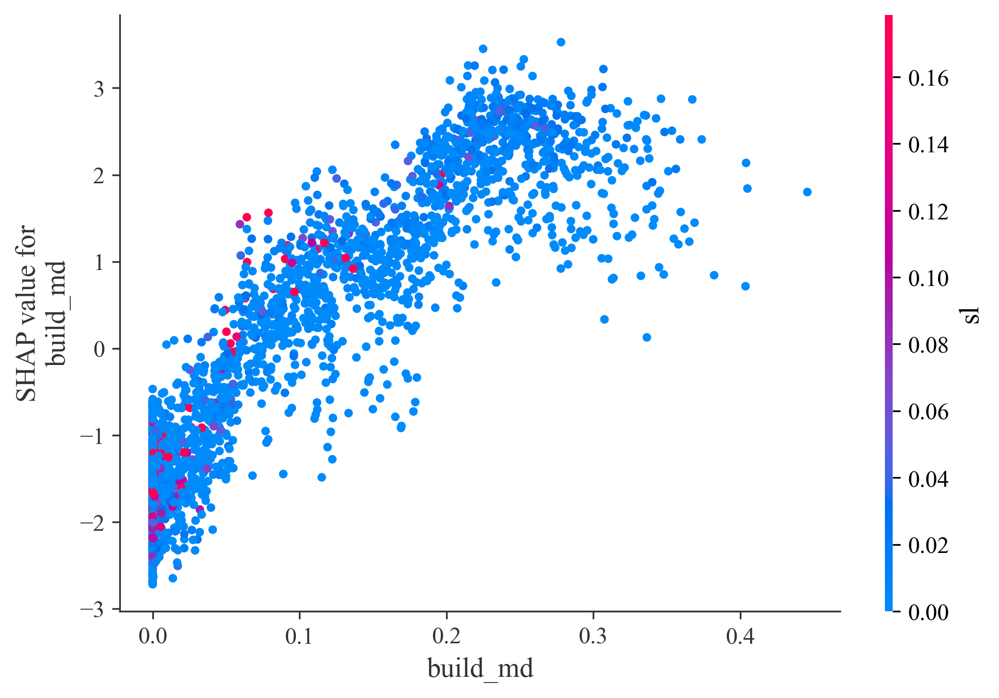

In [46]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='sl', show=False)

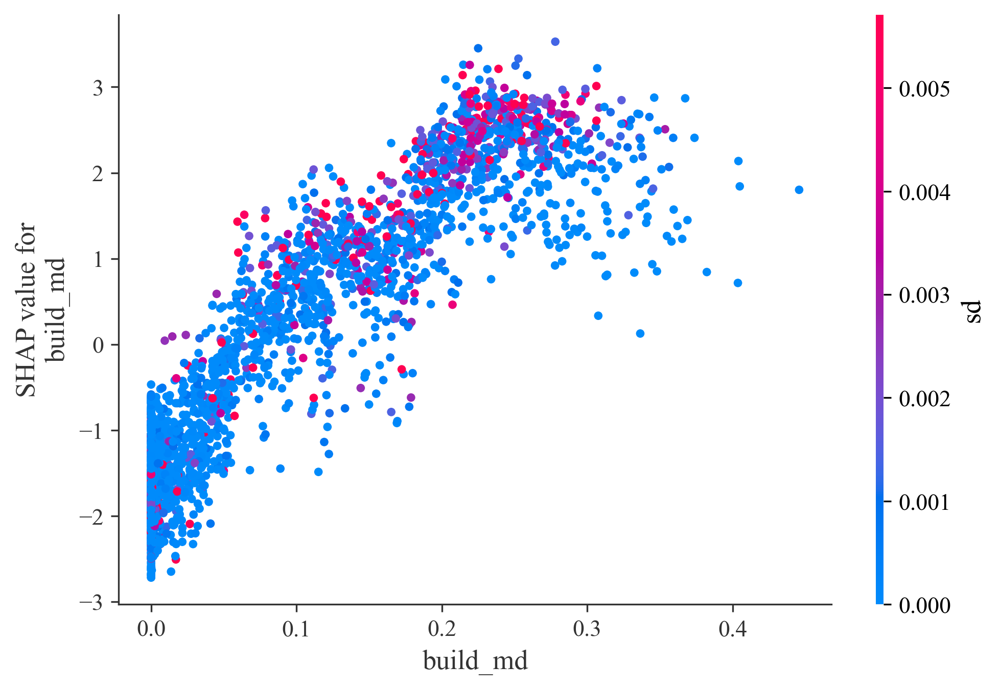

In [47]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='sd', show=False)

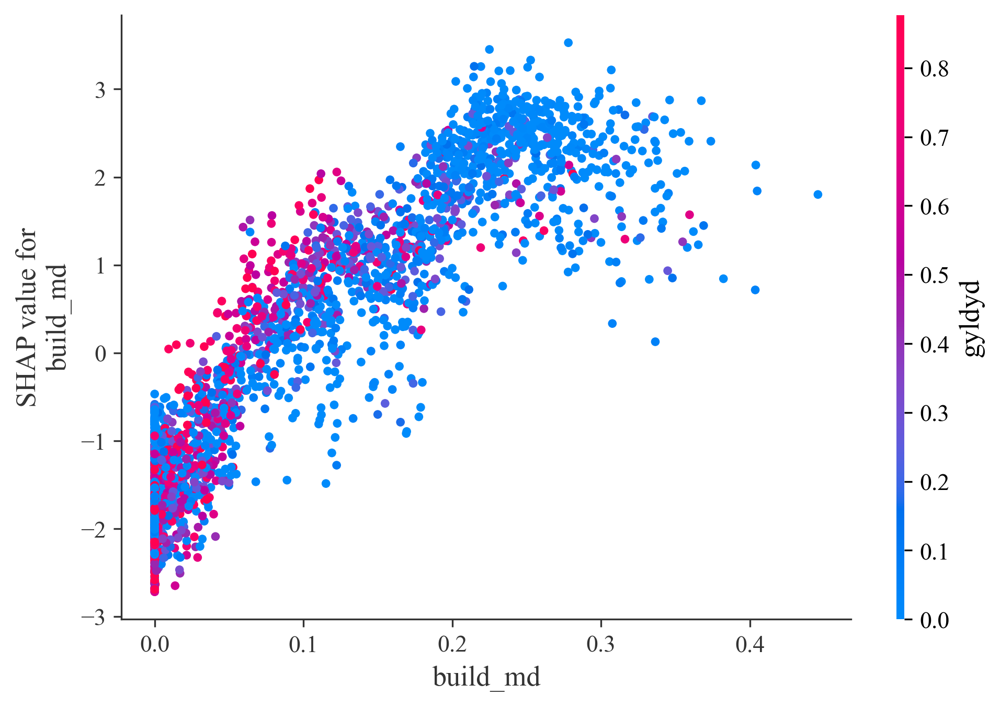

In [48]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='gyldyd', show=False)

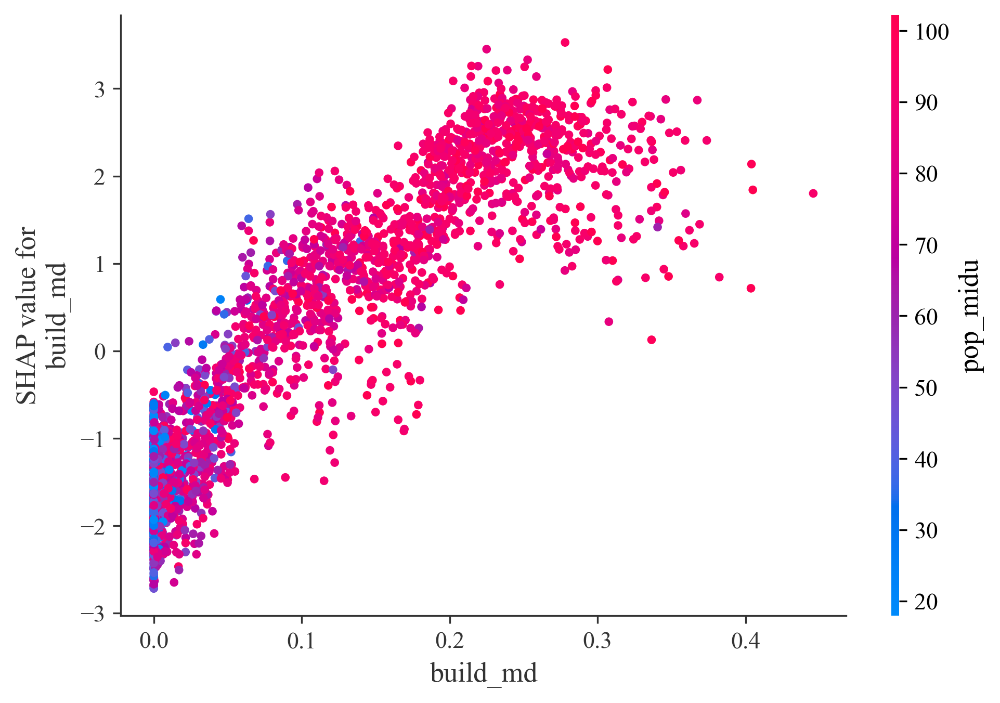

In [49]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='pop_midu', show=False)

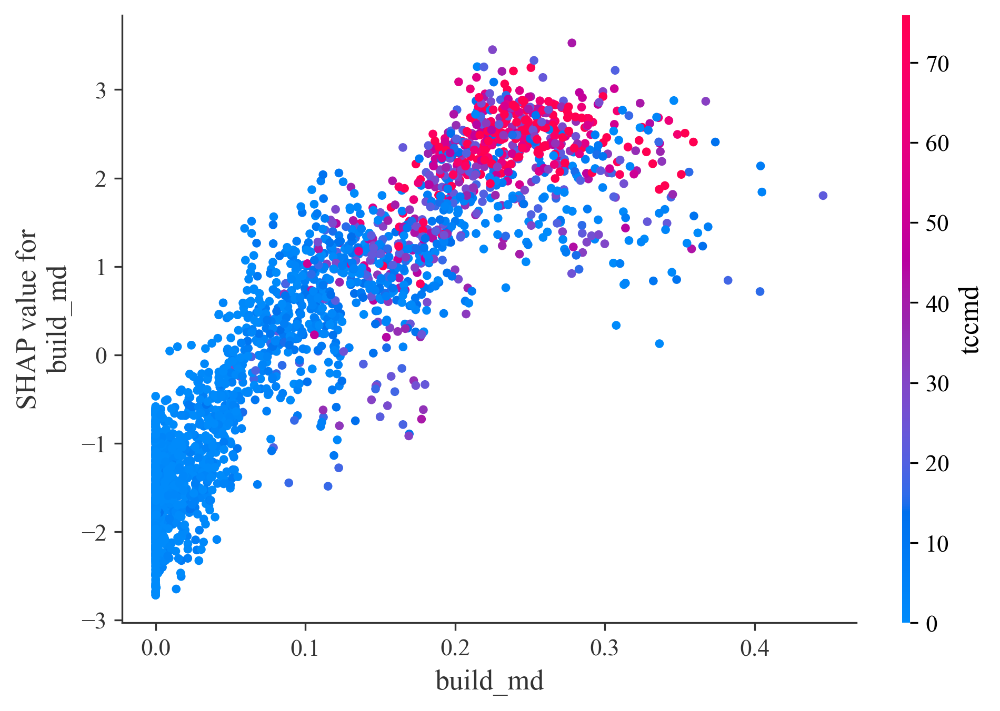

In [50]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('build_md', shap_values, data[cols], interaction_index='tccmd', show=False)

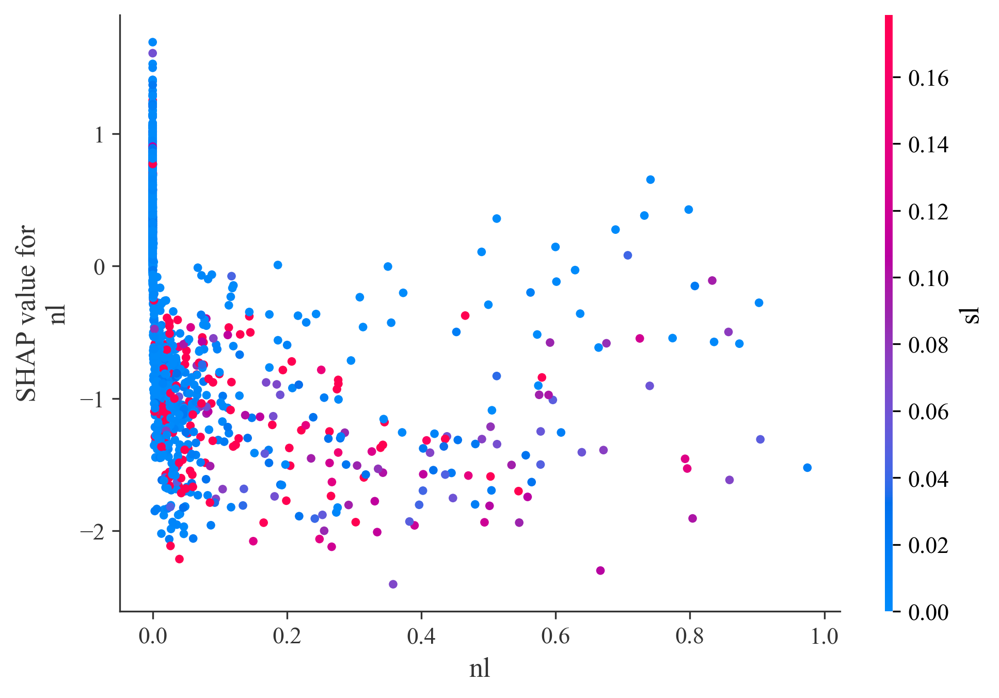

In [51]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='sl', show=False)

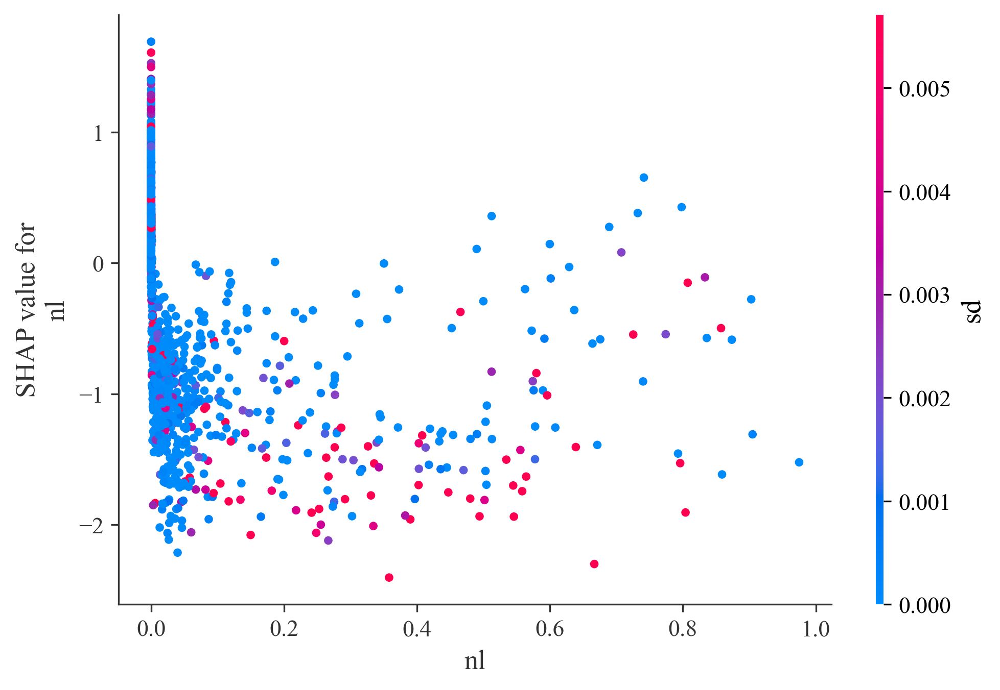

In [52]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='sd', show=False)

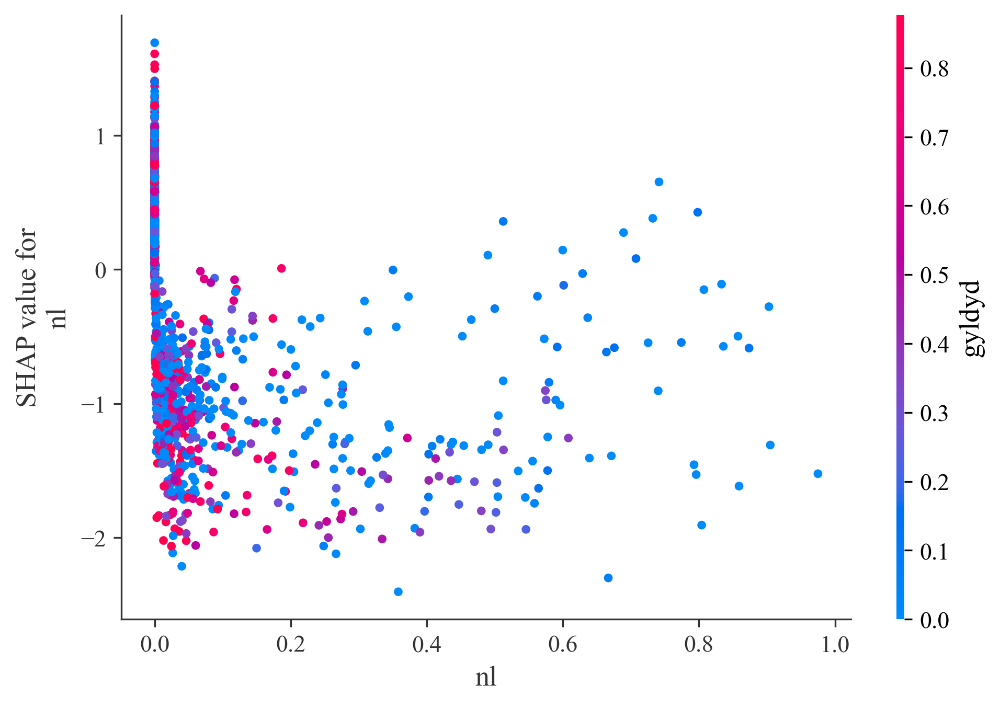

In [53]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='gyldyd', show=False)

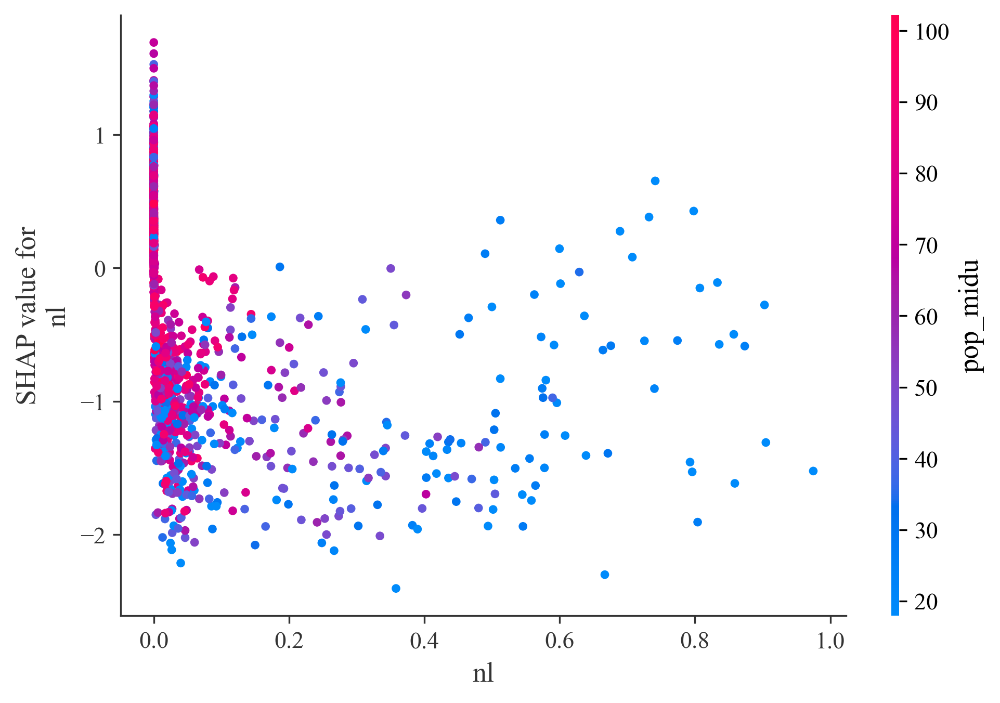

In [54]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='pop_midu', show=False)

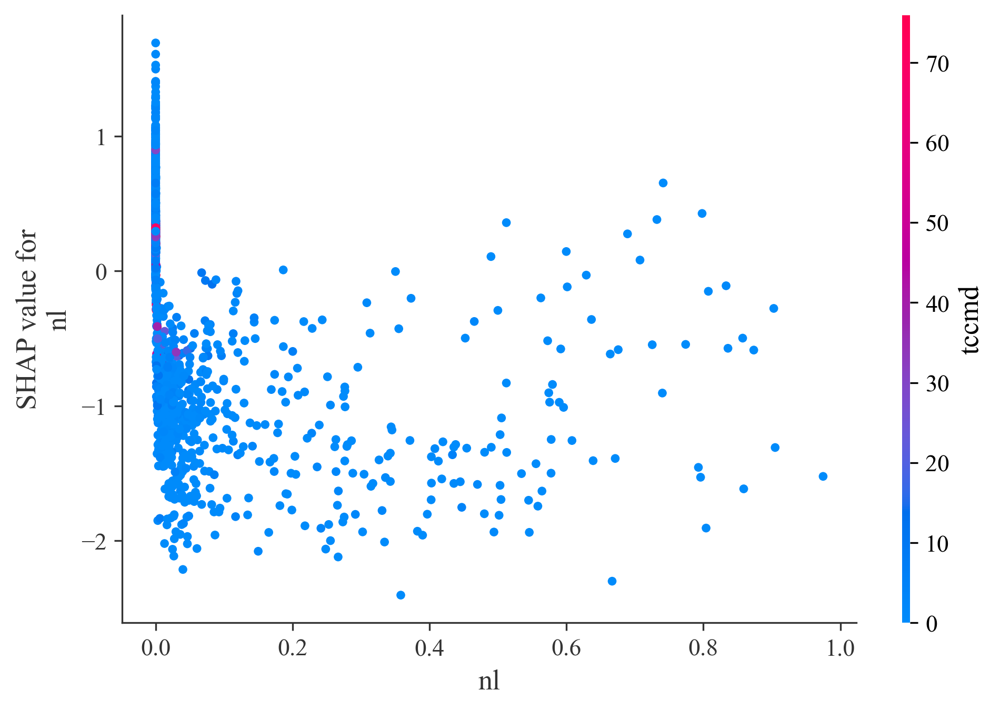

In [55]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('nl', shap_values, data[cols], interaction_index='tccmd', show=False)

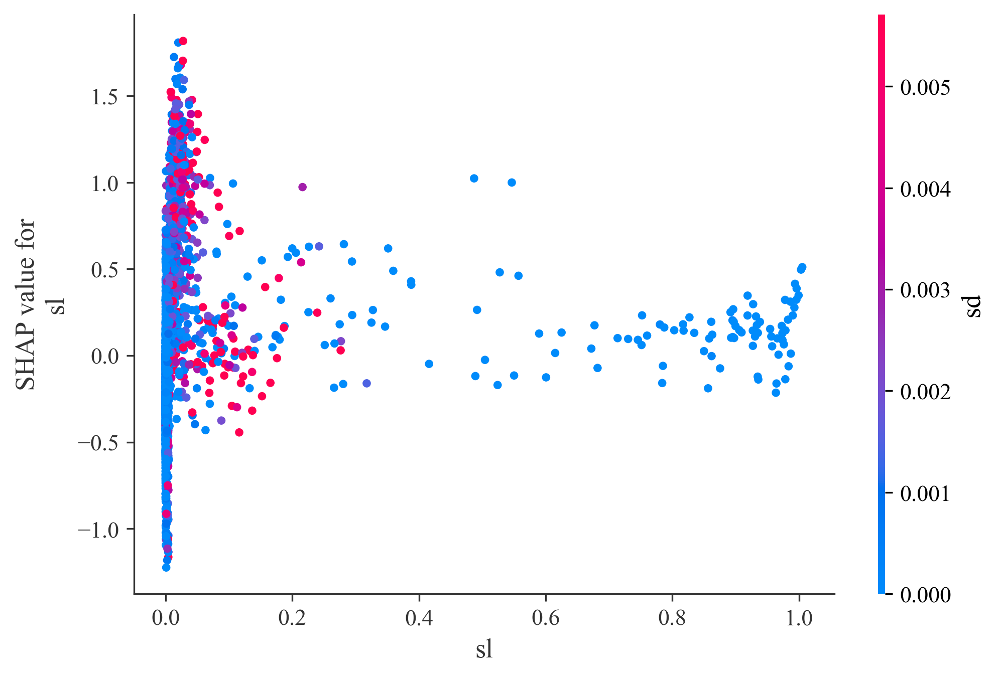

In [56]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='sd', show=False)

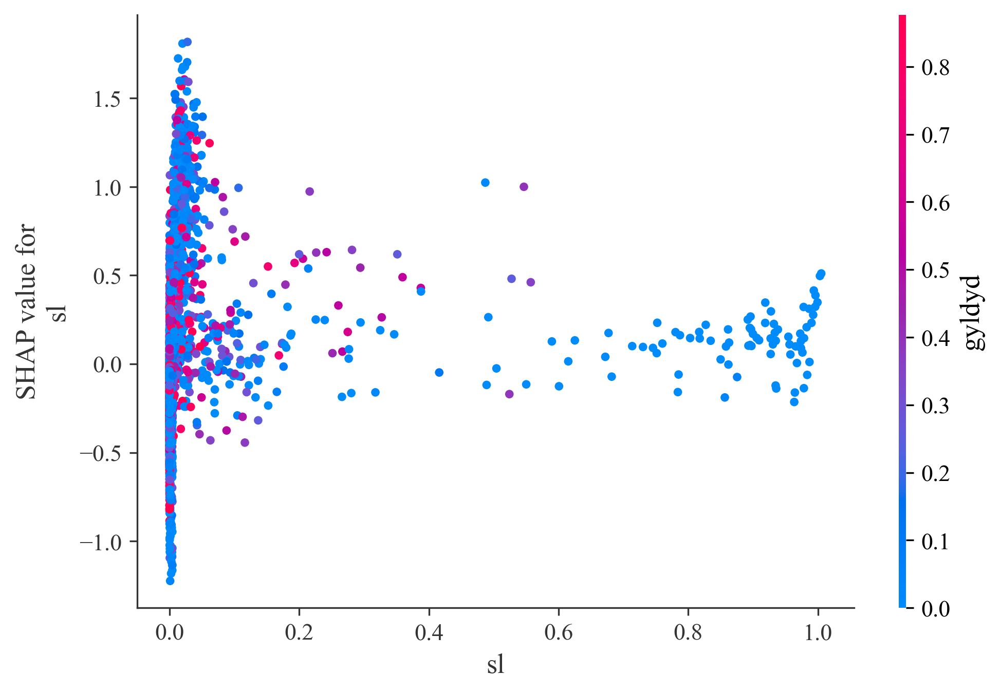

In [57]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='gyldyd', show=False)

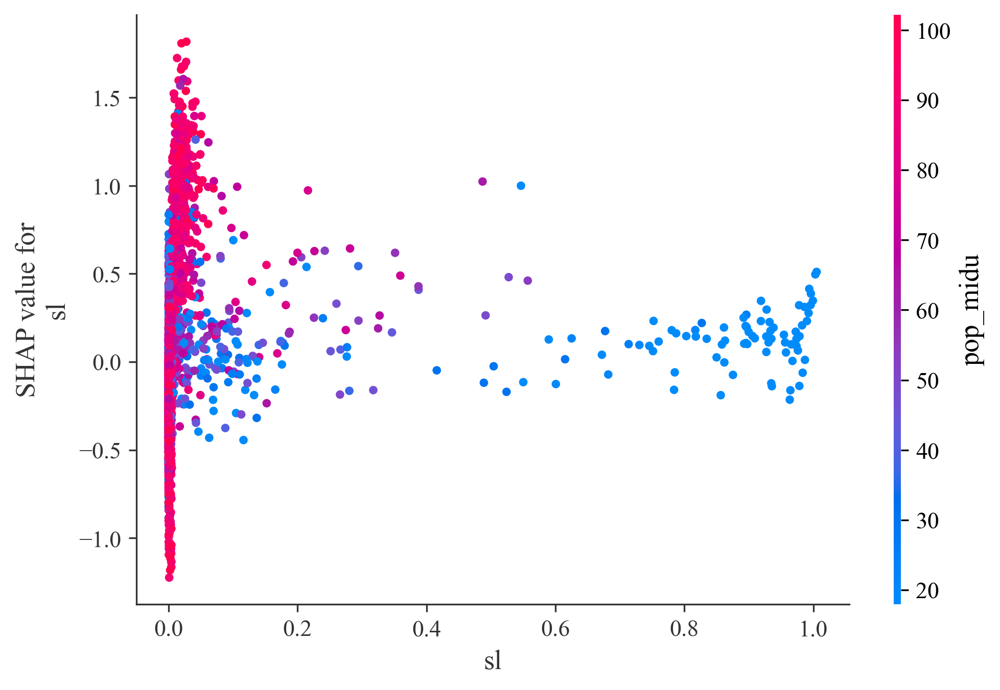

In [58]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='pop_midu', show=False)

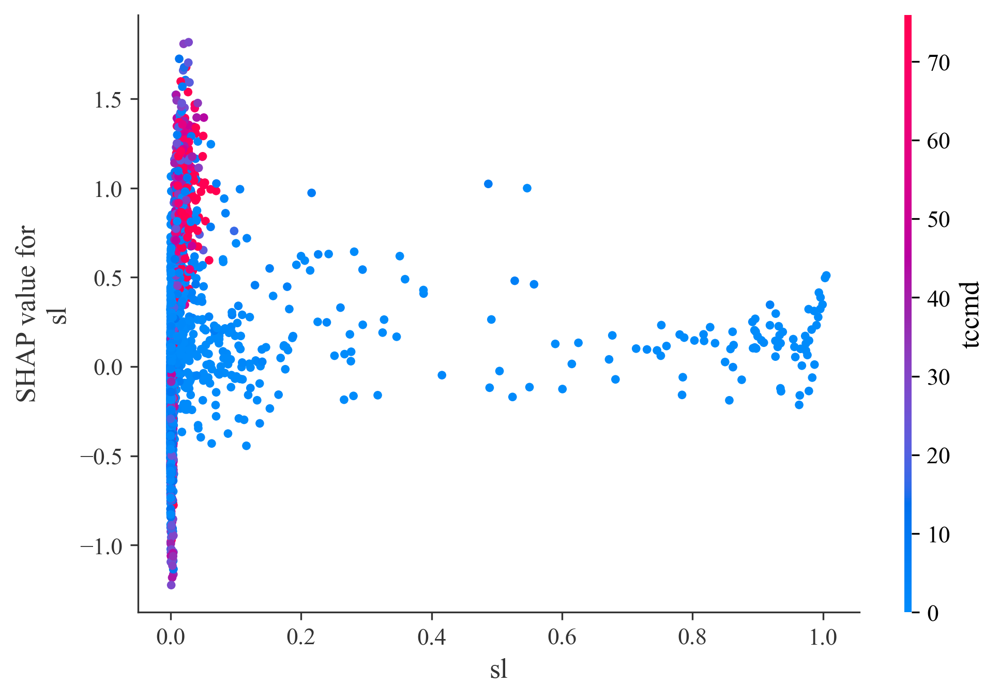

In [59]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sl', shap_values, data[cols], interaction_index='tccmd', show=False)

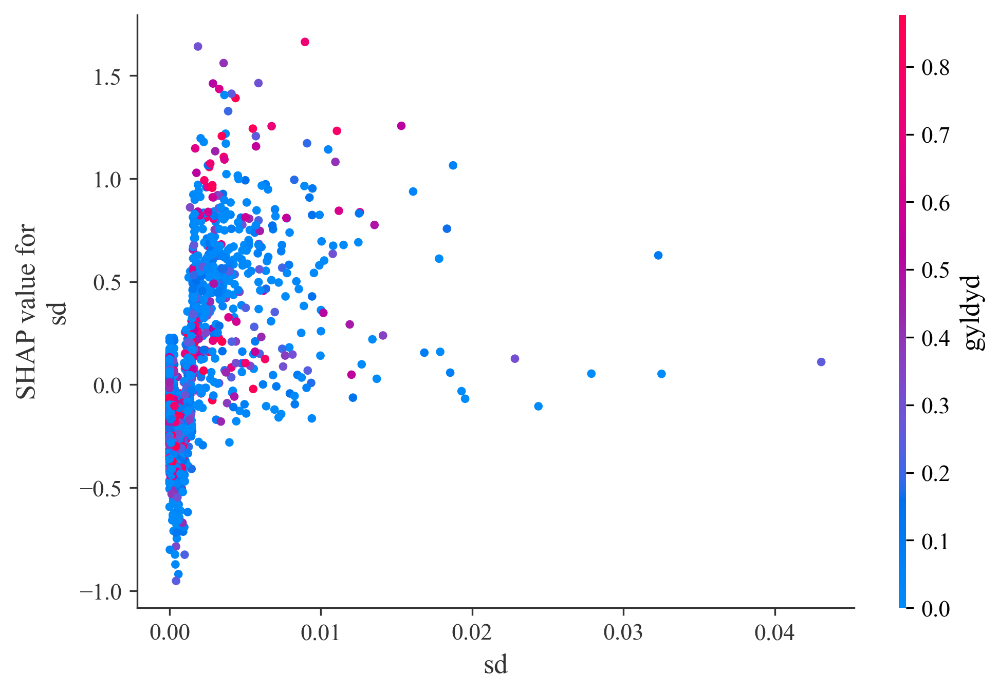

In [60]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='gyldyd', show=False)

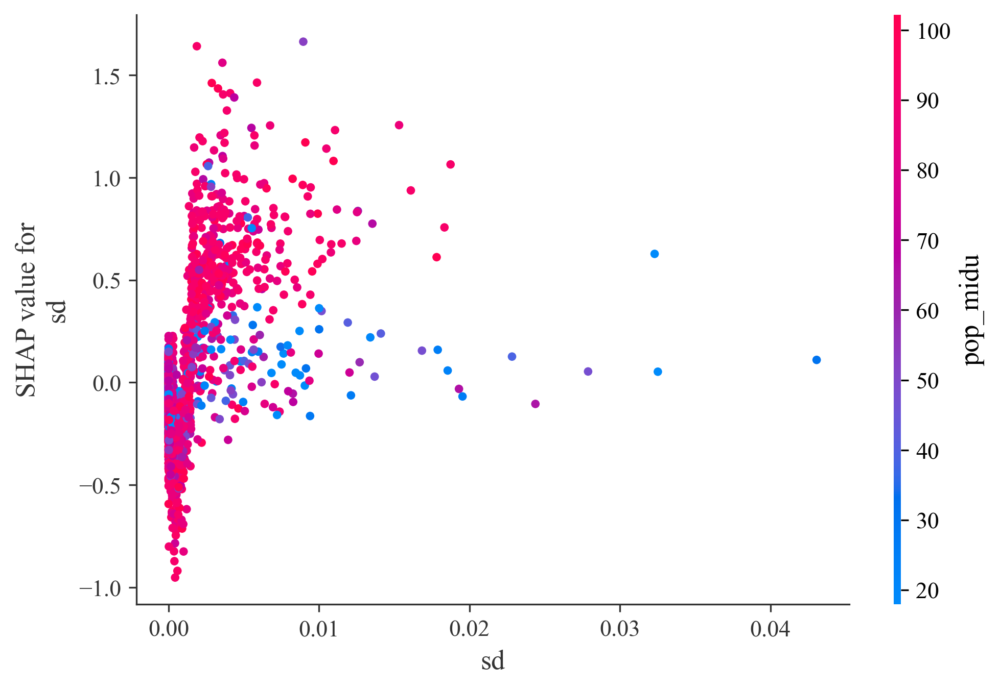

In [61]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='pop_midu', show=False)

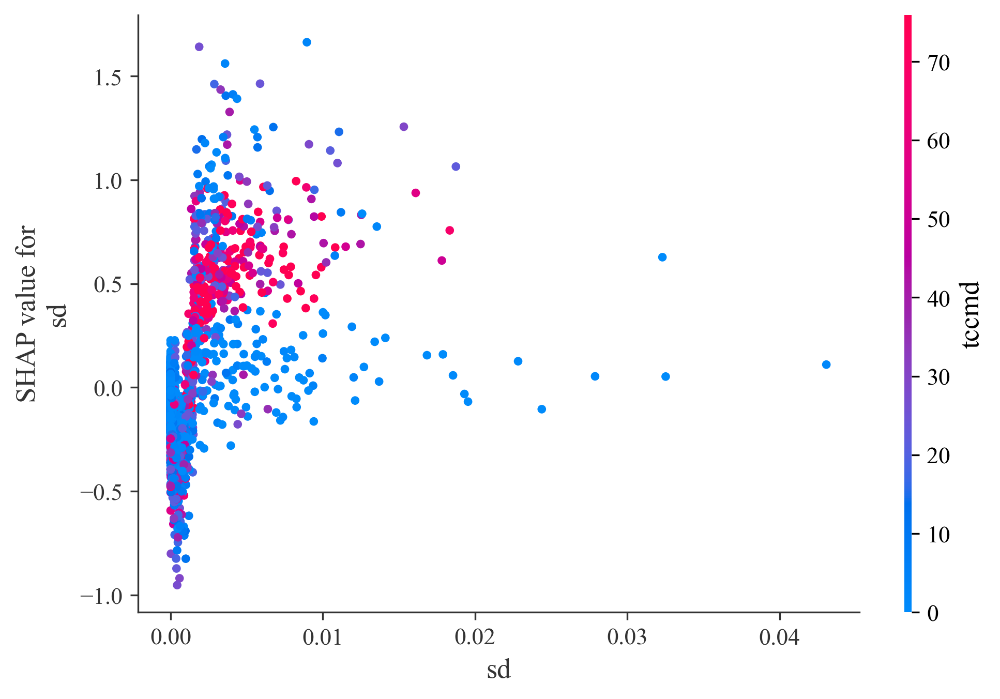

In [62]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('sd', shap_values, data[cols], interaction_index='tccmd', show=False)

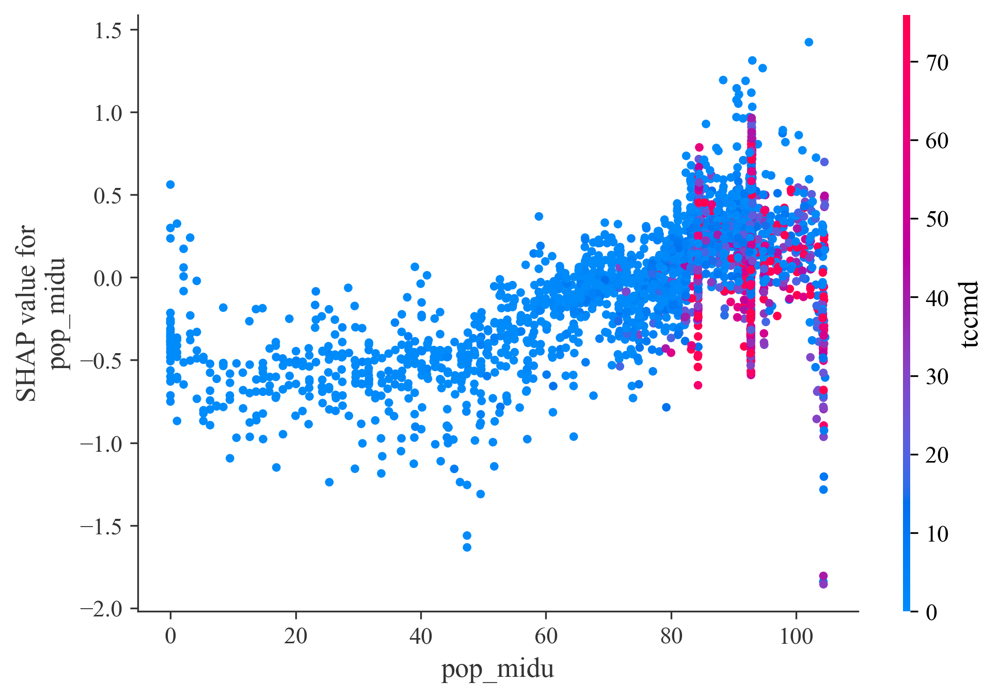

In [63]:
# 描绘两个变量交互下变量对目标值的影响，选择用哪两个变量交互
shap.dependence_plot('pop_midu', shap_values, data[cols], interaction_index='tccmd', show=False)

# PDP

In [64]:
from pdpbox import pdp
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag,figsize=(20,16))

You selected build_md


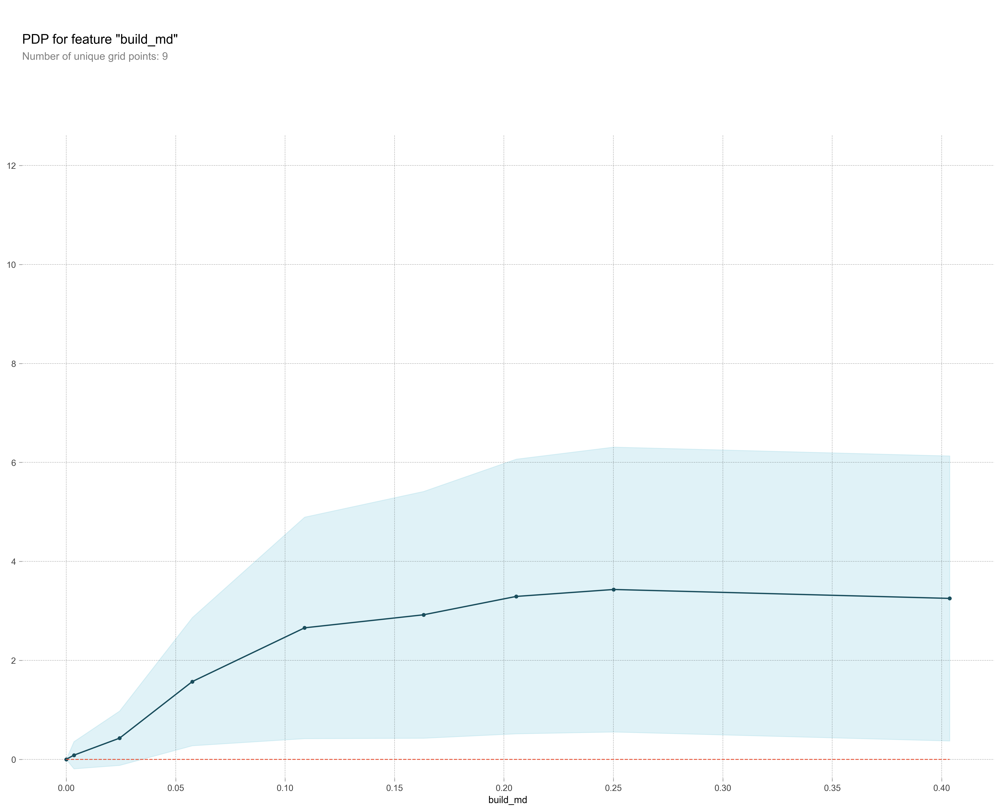

In [38]:
#@title Select a predictor to analyse Linear Regression Model. { run: "auto" }

selected_predictor = "build_md" #@param ['Age_08_04', 'KM', 'HP', 'Met_Color', 'Automatic', 'cc', 'Doors', 'Weight']
print('You selected', selected_predictor)
plot_pdp(model, X_train, selected_predictor)

In [39]:
from pdpbox import pdp
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag, figsize=(20,16))

You selected nl


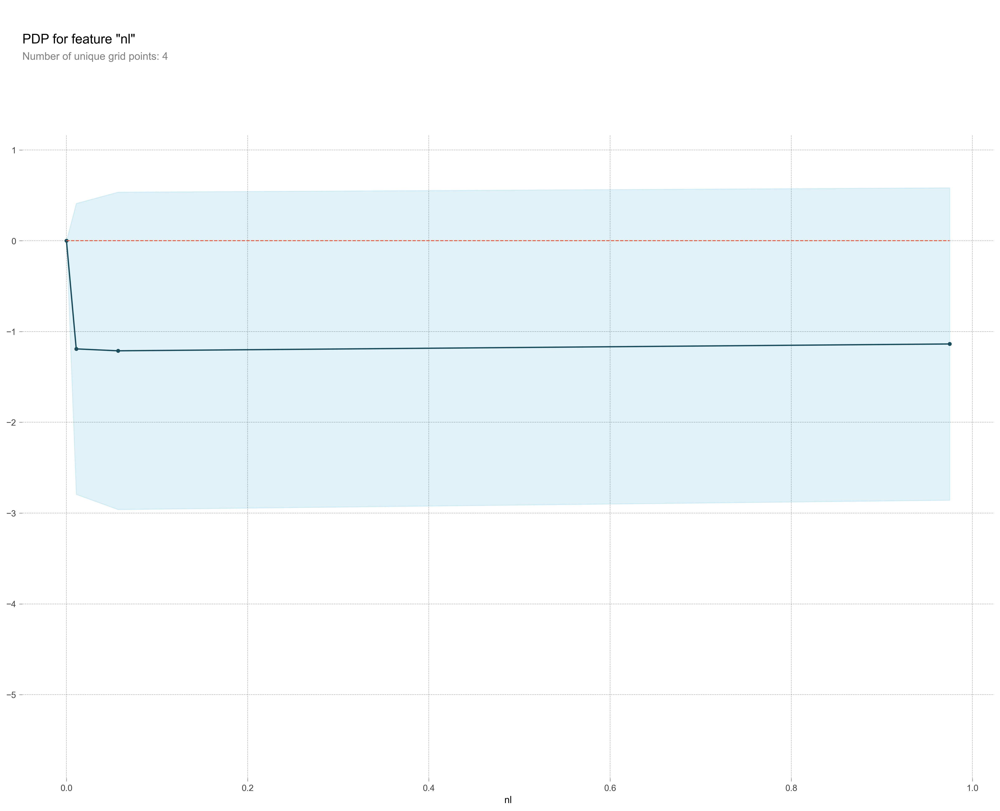

In [40]:
selected_predictor = 'nl'
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected sl


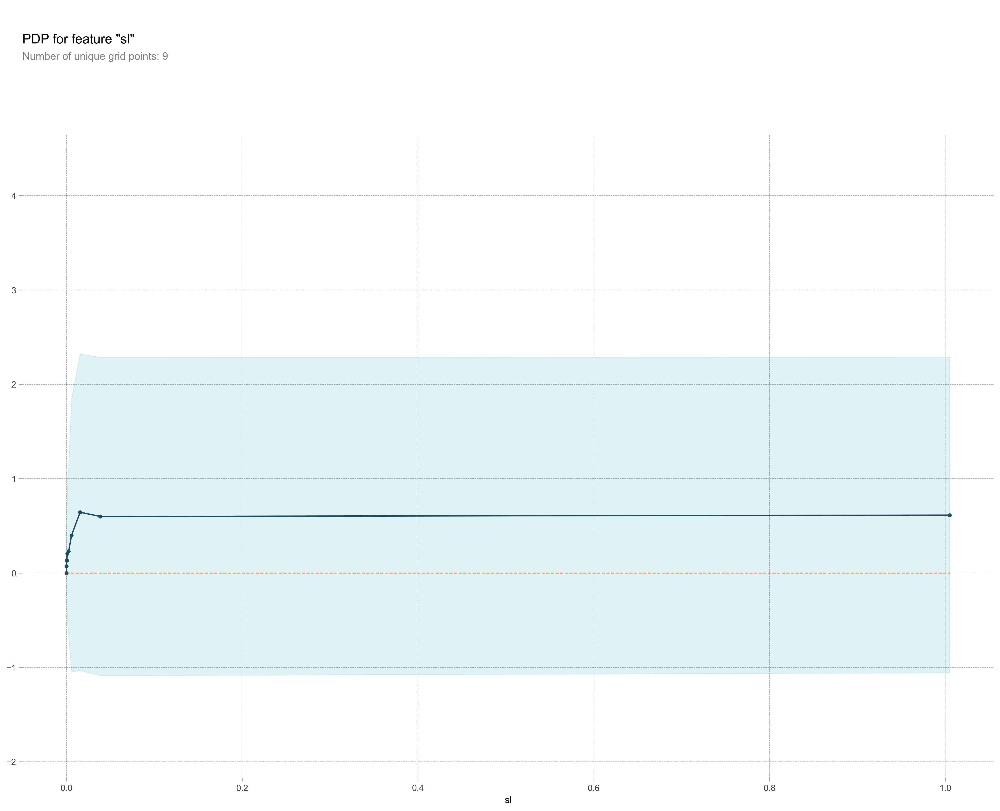

In [41]:
selected_predictor = "sl" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected sd


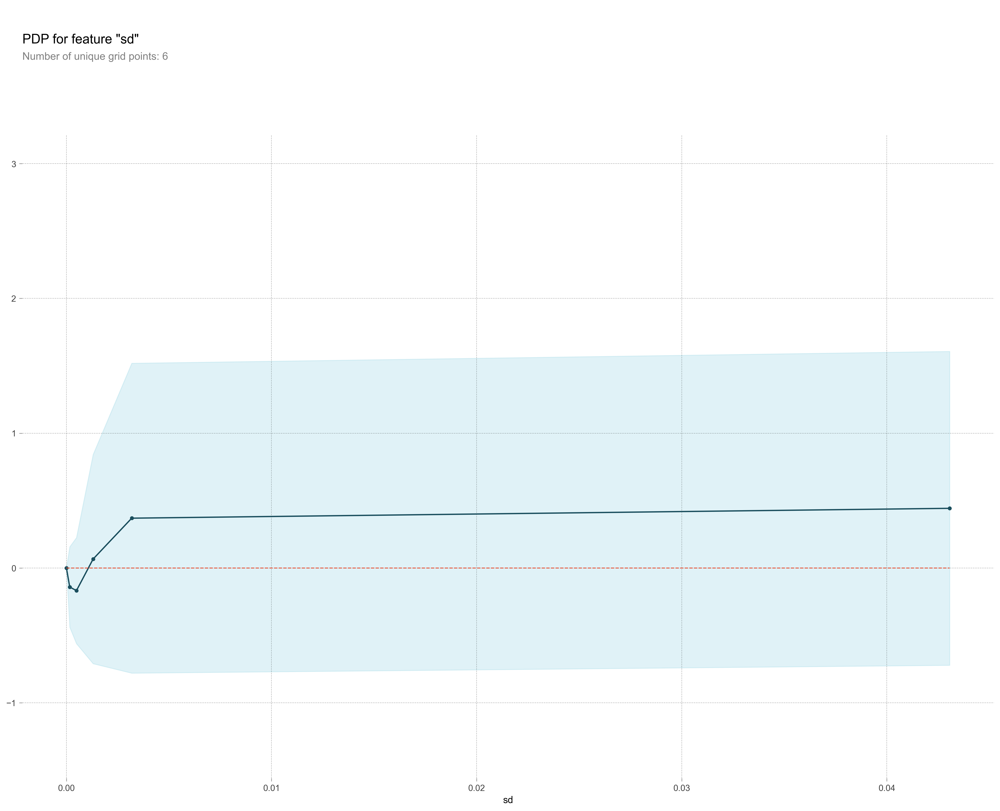

In [42]:
selected_predictor = "sd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected gyldyd


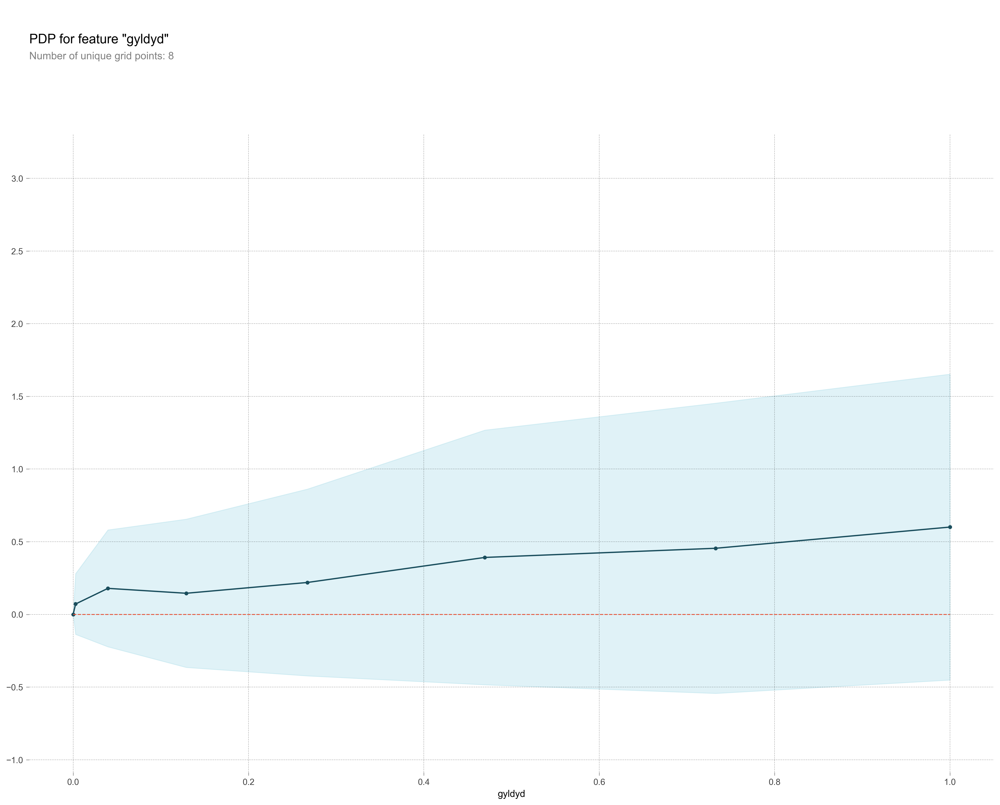

In [43]:
selected_predictor = "gyldyd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected pop_midu


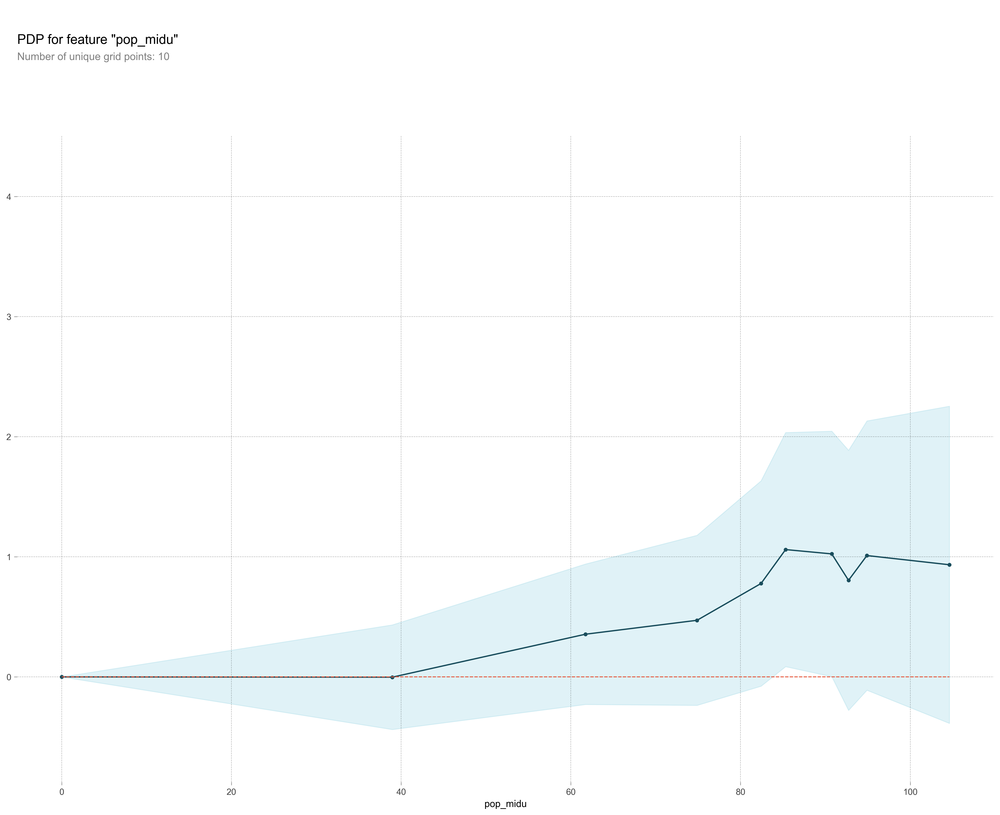

In [44]:
selected_predictor = "pop_midu" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)

You selected tccmd


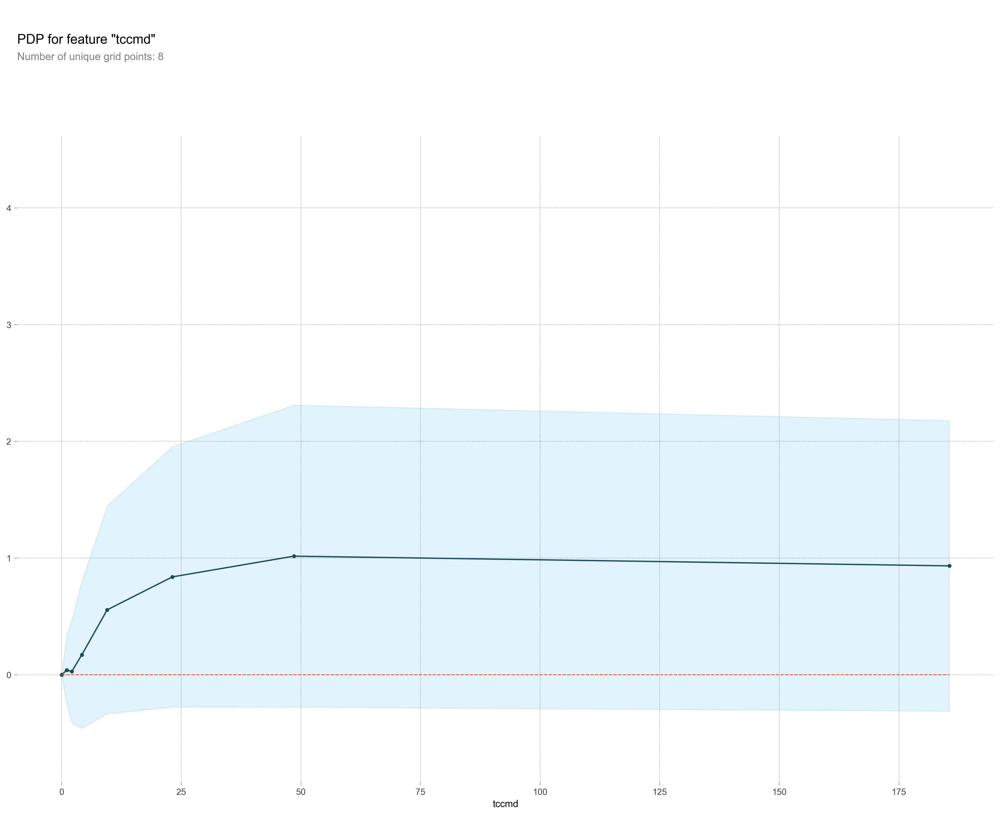

In [45]:
selected_predictor = "tccmd" 
print('You selected', selected_predictor)
plot_pdp(model, X, selected_predictor)